# Предсказание коэффициента восстановления золота

## Получение и изучение данных

### Поставленная задача и исходные данные

**Заказчик: компания «Цифра»**

Компания разрабатывает решения для эффективной работы промышленных предприятий.

**Цель**

Подготовить прототип модели машинного обучения.

**Исходные данные**

Предоставлены данные с параметрами добычи и очистки золотосодержащей руды.

**Задачи**

- Подготовить данные.
- Провести исследовательский анализ данных.
- Построить и обучить модель.


**Условия**

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды.

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

**Технология**

| <font size="2">**Функциональная схема** | <font size="2">**Описание технологического процесса получения золота из руды**  |
| :--- | :--- |
|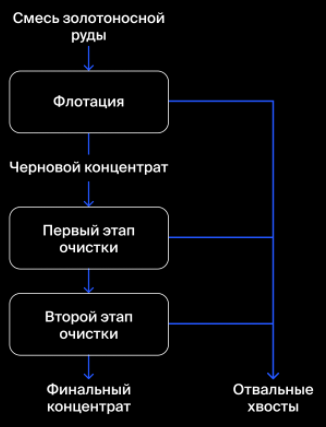|<font size="2">Когда добытая руда проходит первичную обработку, получается дроблёная смесь.<br>Её отправляют на флотацию(обогащение) и двухэтапную очистку.<br><br>**1. Флотация**<br><br>Во флотационную установку подаётся смесь золотосодержащей руды.<br>После обогащения получается черновой концентрат и «отвальные хвосты», то есть остатки продукта с низкой концентрацией ценных металлов.<br><br>На стабильность этого процесса влияет непостоянное и неоптимальное<br>физико-химическое состояние флотационной пульпы (смеси твёрдых частиц и жидкости).<br><br>**2. Очистка**<br><br>Черновой концентрат проходит две очистки.<br>На выходе получается финальный концентрат и новые отвальные хвосты.| 

**Описание данных**
    
*Технологический процесс*
    
- Rougher feed — исходное сырье
- Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
    - Xanthate **— ксантогенат (промотер, или активатор флотации);
    - Sulphate — сульфат (на данном производстве сульфид натрия);
    - Depressant — депрессант (силикат натрия).
- Rougher process (англ. «грубый процесс») — флотация
- Rougher tails — отвальные хвосты
- Float banks — флотационная установка
- Cleaner process — очистка
- Rougher Au — черновой концентрат золота
- Final Au — финальный концентрат золота

*Параметры этапов*

- air amount — объём воздуха
- fluid levels — уровень жидкости
- feed size — размер гранул сырья
- feed rate — скорость подачи

**Наименование признаков**

Наименование признаков должно быть такое:

`[этап].[тип_параметра].[название_параметра]`

Пример: `rougher.input.feed_ag`

Возможные значения для блока `[этап]`:
- rougher — флотация
- primary_cleaner — первичная очистка
- secondary_cleaner — вторичная очистка
- final — финальные характеристики

Возможные значения для блока `[тип_параметра]`:
- input — параметры сырья
- output — параметры продукта
- state — параметры, характеризующие текущее состояние этапа
- calculation — расчётные характеристики

**Расчёт эффективности**

Эффективность обогащения рассчитывается по формуле: $Recovery = \large\frac{C\cdot(F-T)}{F\cdot(C-T)}\small\cdot100$%

где:
- C — доля золота в концентрате после флотации/очистки;
- F — доля золота в сырье/концентрате до флотации/очистки;
- T — доля золота в отвальных хвостах после флотации/очистки.

Для прогноза коэффициента нужно найти долю золота в концентратах и хвостах. Причём важен не только финальный продукт, но и черновой концентрат.

**Метрика качества**

Для решения задачи необходимо вычислить метрику качества — sMAPE (англ. Symmetric Mean Absolute Percentage Error, «симметричное среднее абсолютное процентное отклонение»). Она выражается в относительных величинах и одинаково учитывает масштаб и целевого признака, и предсказания.

Метрика sMAPE вычисляется так: $sMAPE=\large{\frac 1N}{\sum_{i=1}^N} \Large\frac{|y_i-ŷ_i|}{(|y_i|+|ŷ_i|)/2}\small\cdot100$%

где:

${\large y_i}$ - значение целевого признака для объекта с порядковым номером i в выборке, на которой измеряется качество

${\large ŷ_i}$ - значение предсказания для объекта с порядковым номером i, например, в тестовой выборке

${\large N}$ - количество объектов в выборке

${\large \sum_{i=1}^N}$ - cуммирование по всем объектам выборки (i меняется от 1 до N)

<br>Нужно спрогнозировать сразу две величины:

- эффективность обогащения чернового концентрата `rougher.output.recovery`;
- эффективность обогащения финального концентрата `final.output.recovery`.

Итоговая метрика складывается из двух величин: $\large \binom{итоговое}{sMAPE}\small=25\% \cdot sMAPE(rougher)+75\% \cdot sMAPE(final)$

**Описание проекта**

Данные находятся в трёх файлах:

- `gold_recovery_train_new.csv` — обучающая выборка;
- `gold_recovery_test_new.csv` — тестовая выборка;
- `gold_recovery_full_new.csv` — исходные данные.

Данные индексируются датой и временем получения информации (признак `date`).

Соседние по времени параметры часто похожи.
<br>Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже. Из-за этого в тестовой выборке отсутствуют некоторые признаки, которые могут быть в обучающей. Также в тестовом наборе нет целевых признаков.

Исходный датасет содержит обучающую и тестовую выборки со всеми признаками.

Предоставлены сырые данные: их просто выгрузили из хранилища.<br>Прежде чем приступить к построению модели, необходимо проверить данные на корректность.

### Импорт библиотек, установка глобальных настроек, cоздание классов

<ins>Импорт библиотек и установка глобальных настроек проекта</ins>

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.size'] = '13'

import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('Set2')

import plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default='notebook'


import numpy as np

import re

import phik
from phik.report import plot_correlation_matrix
from phik import report

from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, LinearRegression, Lasso
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_absolute_error, make_scorer

<ins>Создание классов</ins>

Для удобства вывода на печать создадим класс для работы с текстом

In [2]:
class color:
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

### Обзор данных

<ins>Чтение файлов с данными</ins>

Согласно описанию - данные индексируются датой и временем получения информации (признак `date`), выполним это условие при чтении:
- переведем тип данных в признаке `date` в формат даты (`datetime64[ns]`), используя параметр `parse_dates`
- назначим признак `date` индексом, используя параметр `index_col`

In [3]:
train = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_train_new.csv',
                    parse_dates=['date'], index_col='date')
test = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_test_new.csv',
                   parse_dates=['date'], index_col='date')
full = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_full_new.csv',
                   parse_dates=['date'], index_col='date')

<ins>Изучение общей информации о данных и внесение корректировок на основе наблюдений</ins>

In [4]:
for df in ['train', 'test', 'full']:
    
    print(f'\n\033[1mДатасет {df}\033[0m\n\n\
\033[4mКоличество явных дубликатов:\
{locals()[df].duplicated().sum()}\n\n\
\033[4mПризнаки без пропусков:\033[0m\n\
{locals()[df].columns[locals()[df].isna().sum()==0]}\n\n\
\033[4mИнформация (в долях) о пропусках с долей более 0.01:\033[0m\n\
{locals()[df].isna().mean().sort_values(ascending=False)[locals()[df].isna().mean().sort_values(ascending=False)>0.01].round(3)}\n')
    
    display(locals()[df].info(), locals()[df].head())
    try:
        display (locals()[df][['rougher.output.recovery', 'final.output.recovery']].describe())
    except:
        print ('Целевые признаки отсутствуют')                


Датасет train

Количество явных дубликатов:0

Признаки без пропусков:
Index(['final.output.concentrate_au', 'final.output.recovery',
       'final.output.tail_ag', 'final.output.tail_au',
       'primary_cleaner.input.feed_size',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_au', 'rougher.calculation.au_pb_ratio',
       'rougher.input.feed_ag', 'rougher.input.feed_au',
       'rougher.output.concentrate_ag', 'rougher.output.concentrate_pb',
       'rougher.output.concentrate_au', 'rougher.output.recovery',
       'rougher.output.tail_pb', 'rougher.output.tail_sol',
       'rougher.output.tail_au', 'rougher.state.floatbank10_d_air',
       'rougher.state.floatbank10_d_level',
       'rougher.state.floatbank10_e_level', 'rougher.state.floatbank10_f_air',
       'rougher.state.floatbank10_f_level',
       'secondary_cleaner.output.tail_au'],
      dtype='object')

Информация (в долях) о пропусках с дол

None

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.

,rougher.output.recovery,final.output.recovery
count,14149.000000,14149.000000
mean,82.704502,66.518832
std,14.479156,10.295402
min,0.000000,0.000000
25%,79.993067,62.545817
50%,85.299462,67.432775
75%,90.165021,72.346428
max,100.000000,100.000000



Датасет test

Количество явных дубликатов:0

Признаки без пропусков:
Index(['primary_cleaner.input.feed_size',
       'primary_cleaner.state.floatbank8_a_air',
       'primary_cleaner.state.floatbank8_a_level',
       'primary_cleaner.state.floatbank8_b_air',
       'primary_cleaner.state.floatbank8_b_level',
       'primary_cleaner.state.floatbank8_c_air',
       'primary_cleaner.state.floatbank8_c_level',
       'primary_cleaner.state.floatbank8_d_air',
       'primary_cleaner.state.floatbank8_d_level', 'rougher.input.feed_ag',
       'rougher.input.feed_pb', 'rougher.input.feed_au',
       'rougher.input.floatbank10_xanthate', 'rougher.state.floatbank10_a_air',
       'rougher.state.floatbank10_a_level', 'rougher.state.floatbank10_b_air',
       'rougher.state.floatbank10_b_level', 'rougher.state.floatbank10_c_air',
       'rougher.state.floatbank10_c_level', 'rougher.state.floatbank10_d_air',
       'rougher.state.floatbank10_d_level', 'rougher.state.floatbank10_e_air',
       'ro

None

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,-500.704369,1399.001695,-499.485144,13.128569,5.636710,489.793655,62.710452,42.022440,12.084103,16.922877,6.153479,16.867518,6.150709,1001.849317,-350.301265,1249.738612,-399.107531,1249.750520,-399.396730,1198.287855,-399.488594,999.472250,-399.530962,949.566189,-398.180807,24.938200,-500.490963,14.947607,-500.013837,20.018166,-450.395995,13.987058,-449.831513,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,-499.240168,1399.508091,-500.416324,13.036280,5.526065,490.104534,61.961163,41.187903,11.918977,17.002532,5.999043,16.996063,6.002315,998.690785,-350.425704,1248.395457,-399.946025,1249.514451,-399.630810,1200.506459,-399.942434,1000.002114,-399.491528,950.200009,-405.787514,24.923466,-499.813963,14.930873,-500.764452,19.988503,-450.114024,14.092981,-450.059163,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,-502.151509,1399.497088,-499.715479,13.138412,5.426561,489.617969,66.903807,42.546294,12.091332,16.992520,5.850632,16.982096,5.853594,998.516720,-349.783538,1247.440748,-400.264330,1248.207204,-401.074405,1199.770026,-400.790582,999.925519,-399.236999,950.320481,-400.864340,24.908732,-500.304035,14.996511,-500.993821,20.039689,-450.263164,14.077881,-449.660997,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,-498.355873,1401.065165,-501.038738,12.400507,5.114758,476.618130,59.865919,41.060195,12.181597,16.532144,5.801935,16.515277,5.803657,1000.276604,-350.172597,1251.322675,-398.655289

Целевые признаки отсутствуют

Датасет full

Количество явных дубликатов:0

Признаки без пропусков:
Index(['final.output.concentrate_au', 'final.output.recovery',
       'final.output.tail_au', 'primary_cleaner.input.feed_size',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_au', 'rougher.calculation.au_pb_ratio',
       'rougher.input.feed_ag', 'rougher.input.feed_au',
       'rougher.output.concentrate_ag', 'rougher.output.concentrate_pb',
       'rougher.output.concentrate_au', 'rougher.output.recovery',
       'rougher.output.tail_pb', 'rougher.output.tail_sol',
       'rougher.output.tail_au', 'rougher.state.floatbank10_d_air',
       'rougher.state.floatbank10_d_level',
       'rougher.state.floatbank10_e_level', 'rougher.state.floatbank10_f_air',
       'rougher.state.floatbank10_f_level',
       'secondary_cleaner.output.tail_au'],
      dtype='object')

Информация (в долях) о пропусках с долей 

None

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.

,rougher.output.recovery,final.output.recovery
count,19439.000000,19439.000000
mean,83.328587,67.050208
std,14.148086,10.125840
min,0.000000,0.000000
25%,81.037957,63.299712
50%,86.188892,68.172738
75%,90.010670,72.686642
max,100.000000,100.000000


Наблюдения:

- присутствуют пропуски в каждом датасете
- категориальные признаки отсутствуют
- 0 и 100 процентные значения эффективности в целевых признаках
- в тестовой выборке отсутствуют целевые признаки
- в целевых признаках пропусков нет

Решения по обработке наблюдений примем далее.

### Проверка расчёта эффективности обогащения

Рассчитаем эффективность обогащения на обучающей выборке и сохраним значения в переменной `rougher_output_recovery_chek`.

Эффективность обогащения рассчитывается по формуле: $Recovery = \large\frac{C\cdot(F-T)}{F\cdot(C-T)}\small\cdot100$%

где:
- C — доля золота в концентрате после флотации/очистки - признак `rougher.output.concentrate_au`;
- F — доля золота в сырье/концентрате до флотации/очистки - `rougher.input.feed_au`;
- T — доля золота в отвальных хвостах после флотации/очистки - `rougher.output.tail_au`.

In [5]:
C = train['rougher.output.concentrate_au']
F = train['rougher.input.feed_au']
T = train['rougher.output.tail_au']

rougher_output_recovery_chek = C*(F-T)/(F*(C-T))*100

Вычислим метрику `MAE` между признаком `rougher.output.recovery` и переменной `rougher_output_recovery_chek`.

In [6]:
mean_absolute_error(rougher_output_recovery_chek, train['rougher.output.recovery']).round(3)

0.0

- `MAE` (среднее абсолютное отклонение) очень мало, следовательно эффективность обогащения в признаке `rougher.output.recovery` рассчитана верно.

### Анализ признаков, недоступных в тестовой выборке

Проанализируем признаки, недоступные в тестовой выборке.

In [7]:
not_test = set(full.columns) - set(test.columns)
not_test

{'final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.ta

Однозначное описание параметров в исходных данных отсутствует, поэтому представим, что уточнили этот момент у заказчика.

Параметры:
- `final.output.concentrate` - финальный концентрат
- `final.output.recovery` - эффективность обогащения финального концентрата
- `final.output.tail` - финальные отвальные хвосты
- `primary_cleaner.output.concentrate` - концентрат после первичной очистки
- `primary_cleaner.output.tail` - отвальные хвосты после первичной очистки
- `rougher.calculation` - расчётные характеристики на этапе флотации (обогащения)
- `rougher.output.concentrate` - черновой концентрат
- `rougher.output.recovery` - эффективность обогащения чернового концентрата
- `rougher.output.tail` - отвальные хвосты после обогащения
- `secondary_cleaner.output.tail` - отвальные хвосты после второго этапа очистки

Большинство признаков с типом `output` - параметры продукта, несколько признаков с типом `calculation` - расчётные характеристики.

В тестовой выборке отсутствуют целевые признаки:

- эффективность обогащения чернового концентрата `rougher.output.recovery`;
- эффективность обогащения финального концентрата `final.output.recovery`.

### Предобработка данных

#### Заполнение пропусков

Т.к. данные индексируются датой и временем получения информации и соседние по времени параметры часто похожи, то заполним пропуски предыдущим непропущенным значением, передав в функцию `fillna` значение параметра `method='ffill'`

In [8]:
for df in ['full', 'train', 'test']:
    locals()[df]=locals()[df].fillna(method='ffill')
    print(f'количество пропусков {df} : {locals()[df].isna().sum().sum()}')

количество пропусков full : 0
количество пропусков train : 0
количество пропусков test : 0


#### Добавление в тестовую выборку целевых признаков

Т.к. в тестовой выборке отсутствуют целевые признаки, а исходный датасет содержит обучающую и тестовую выборки со всеми признаками, то добавим в тестовую выборку целевые признаки из исходного датасета.

In [9]:
test = test.join(full[['rougher.output.recovery', 'final.output.recovery']])
print(f'размер тестовой выборки: {test.shape}')

размер тестовой выборки: (5290, 54)


#### Удаление из обучающей выборки признаков, недоступных в тестовой выборке

Т.к. в тестовой выборке некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже, то удалим эти параметры и из обучающей выборки для корректного обучения

In [10]:
train = train.drop(set(full.columns) - set(test.columns), axis=1)
print(f'размер обучающей выборки: {train.shape}')

размер обучающей выборки: (14149, 54)


## Анализ данных

### Изменение концентрации металлов (Au, Ag, Pb) на различных этапах очистки.

Получим списки признаков, отвечающих за концентрацию металлов Au, Ag, Pb на различных этапах очистки.

In [11]:
for concentrate in ['concentrate_au', 'concentrate_ag', 'concentrate_pb']:
    locals()[concentrate]=[column_name for column_name in full.columns if concentrate in column_name] 
concentrate_au, concentrate_ag, concentrate_pb

(['final.output.concentrate_au',
  'primary_cleaner.output.concentrate_au',
  'rougher.output.concentrate_au'],
 ['final.output.concentrate_ag',
  'primary_cleaner.output.concentrate_ag',
  'rougher.output.concentrate_ag'],
 ['final.output.concentrate_pb',
  'primary_cleaner.output.concentrate_pb',
  'rougher.output.concentrate_pb'])

Параметры:
- `rougher.output.concentrate` - черновой концентрат
- `primary_cleaner.output.concentrate` - концентрат после первичной очистки
- `final.output.concentrate` - финальный концентрат

Построим гистограммы распределения концентрации металлов

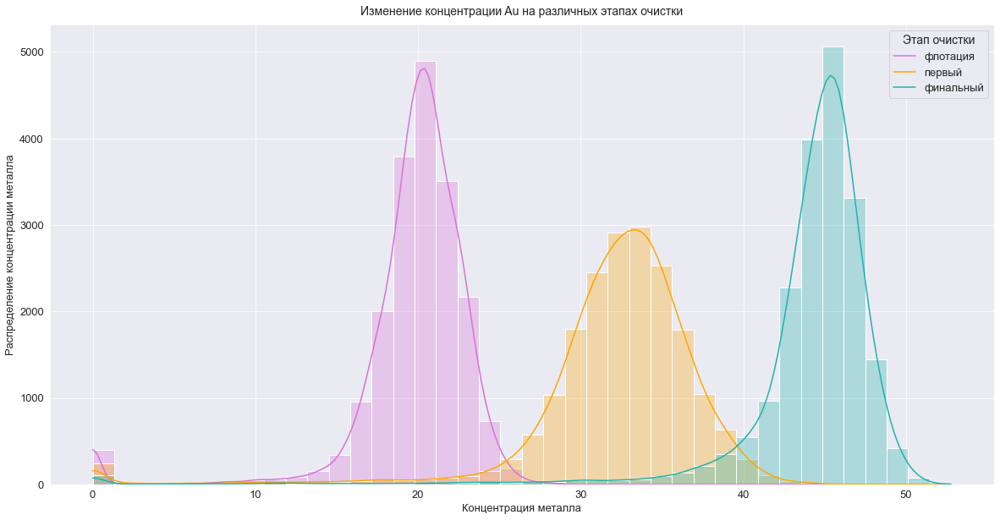

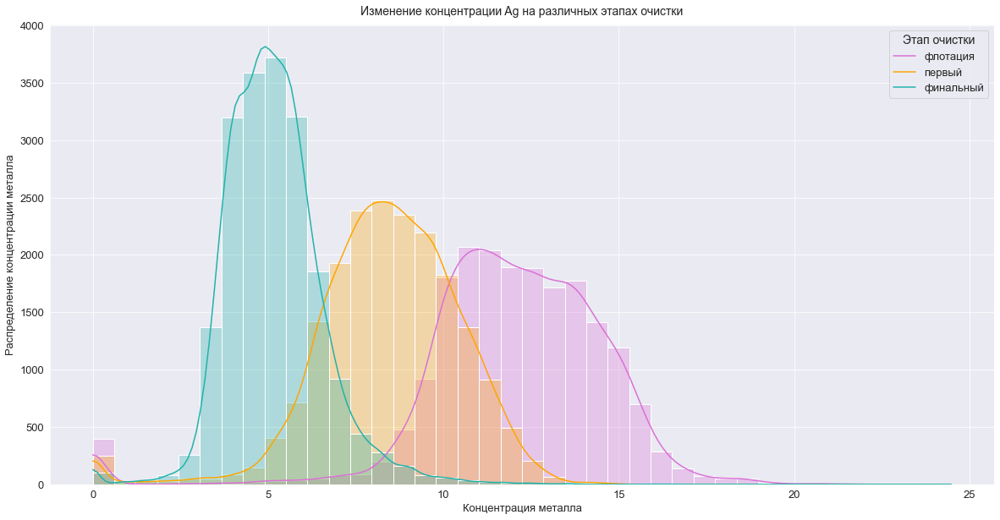

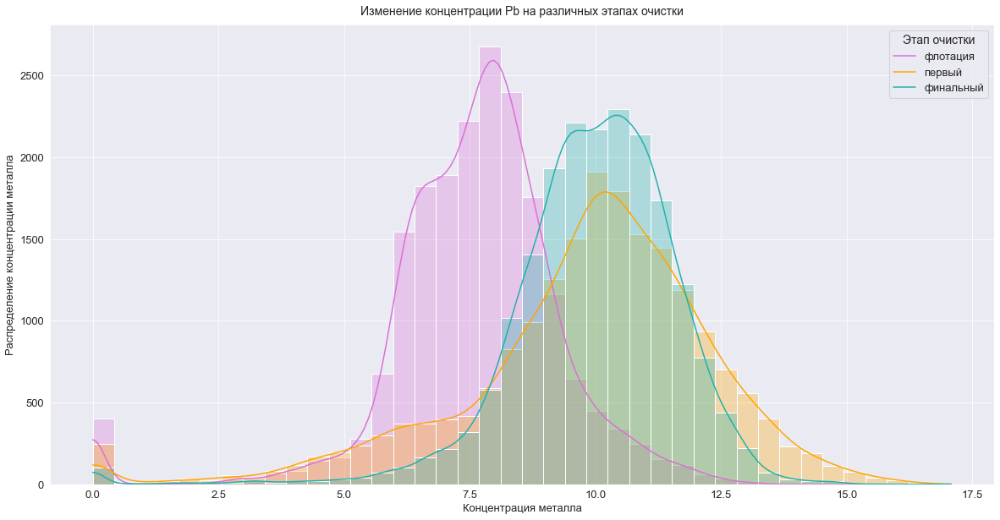

In [12]:
for concentrate, metal in zip([concentrate_au, concentrate_ag, concentrate_pb],
                    ['Au', 'Ag', 'Pb']):    
    plt.figure(figsize=(20,10))
    sns.histplot(data=full[concentrate],
                 bins=40,
                 palette = ['lightseagreen', 'orange', 'orchid'],
                 alpha=.3,
                 kde=True)    

    plt.title(f'Изменение концентрации {metal} на различных этапах очистки', fontsize=14, y=1.01)
    plt.legend(['флотация', 'первый', 'финальный'], title='Этап очистки', title_fontsize = 14)
    plt.xlabel('Концентрация металла')
    plt.ylabel('Распределение концентрации металла')
    plt.show()

<center>Выводы</center>

    
| **Металл** | **Наблюдения** | **Пояснения** |
| :--- | :--- | :--- |
|`Au` - золото|с каждым последующим этапом очистки концентрация увеличивается|в этом заключается цель технологии|
|`Ag` - серебро|с каждым последующим этапом очистки концентрация уменьшается|необходимо очистить смесь от посторонних металлов|
|`Pb` - свинец|после первого этапа очистки концентрация увеличилась, после финальной очистки концентрация осталась примерно на том же уровне, однако пик распределения в данных выше чем после первого этапа|химические соединения свинца добавляют для ускорения процесса извлечения золота|

### Сравнение распределений размеров гранул сырья на обучающей и тестовой выборках

Согласно исходным данным:
- параметр этапов `feed_size` - размер гранул сырья

Получим список признаков, отвечающих за размер гранул сырья.

In [13]:
feed_size=[column_name for column_name in train.columns if 'feed_size' in column_name] 
feed_size

['primary_cleaner.input.feed_size', 'rougher.input.feed_size']

- `primary_cleaner.input.feed_size` - размер гранул чернового концентрата
- `rougher.input.feed_size` - размер гранул исходного сырья

Построим графики оценки плотности ядра.

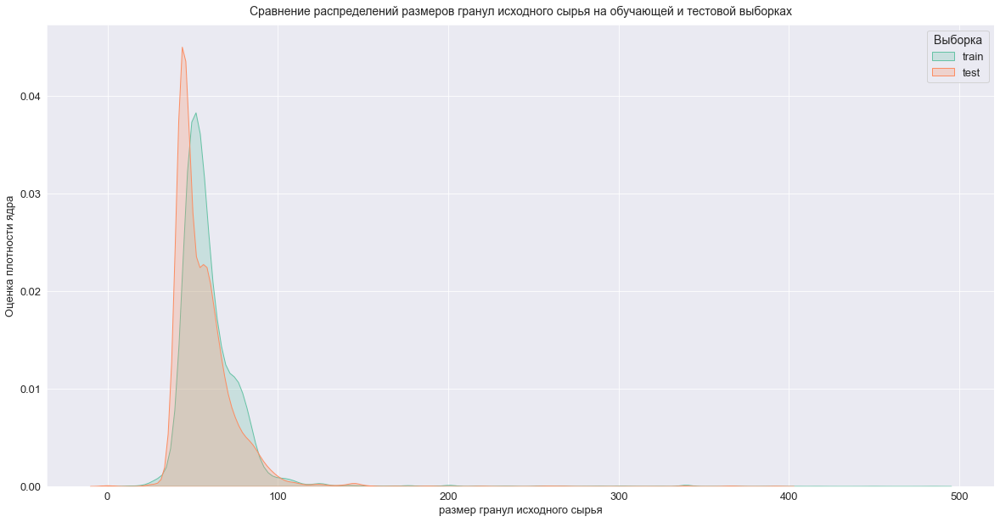

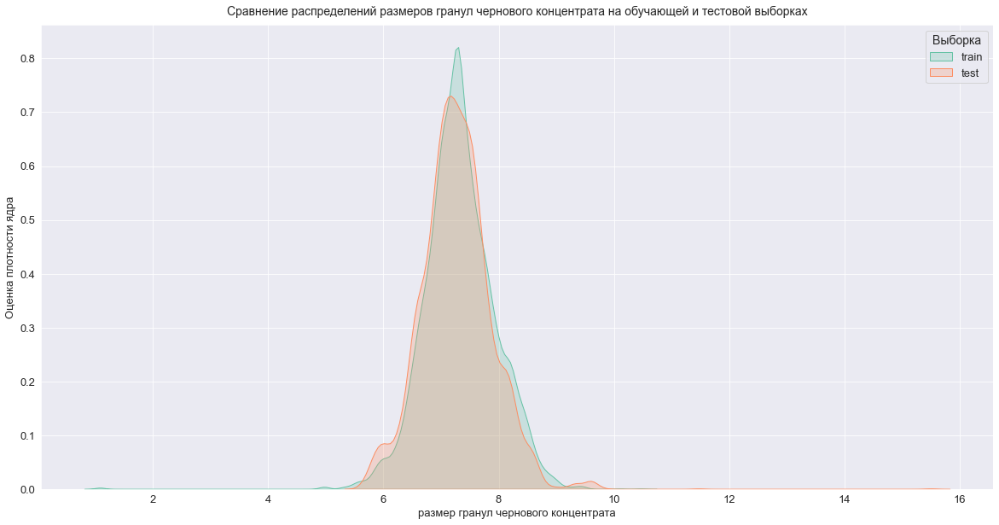

In [14]:
for col, title, x_title in zip(['rougher.input.feed_size', 'primary_cleaner.input.feed_size'],
                               ['исходного сырья','чернового концентрата'],
                               ['размер гранул исходного сырья', 'размер гранул чернового концентрата']):
    plt.figure(figsize=(20,10))
    for selection in [train, test]:
        sns.kdeplot(selection[col], shade=True)
    plt.title(f'Сравнение распределений размеров гранул {title} на обучающей и тестовой выборках', fontsize=14, y=1.01)
    plt.xlabel(x_title)
    plt.ylabel('Оценка плотности ядра')
    plt.legend(['train', 'test'], title='Выборка', title_fontsize = 14)

Визуально распределения отличаются не сильно, отличия не повлияют на оценку модели.

### Исследование суммарной концентрации всех веществ на разных стадиях

#### Добавление расчётных столбцов

Добавим в датафрейм `full` столбцы с расчётом суммарной концентрации всех веществ на разных стадиях.

In [15]:
'''Суммарная концентрация в сырье'''

full['feed_concentrate'] = full[['rougher.input.feed_ag',
                                 'rougher.input.feed_pb',
                                 'rougher.input.feed_sol',
                                 'rougher.input.feed_au']].sum(axis=1)

'''Суммарная концентрация после флотации'''

full['rougher_concentrate'] = full[['rougher.output.concentrate_ag',
                                    'rougher.output.concentrate_pb',
                                    'rougher.output.concentrate_sol',
                                    'rougher.output.concentrate_au']].sum(axis=1)

'''Суммарная концентрация после первой очистки'''

full['primary_concentrate'] = full[['primary_cleaner.output.concentrate_ag',
                                    'primary_cleaner.output.concentrate_pb',
                                    'primary_cleaner.output.concentrate_sol',
                                    'primary_cleaner.output.concentrate_au']].sum(axis=1)

'''Суммарная концентрация в финале'''

full['final_concentrate'] = full[['final.output.concentrate_ag',
                                  'final.output.concentrate_pb',
                                  'final.output.concentrate_sol',
                                  'final.output.concentrate_au']].sum(axis=1)

#### Гистограммы распределения концентраций

Построим гистограммы распределения концентраций.

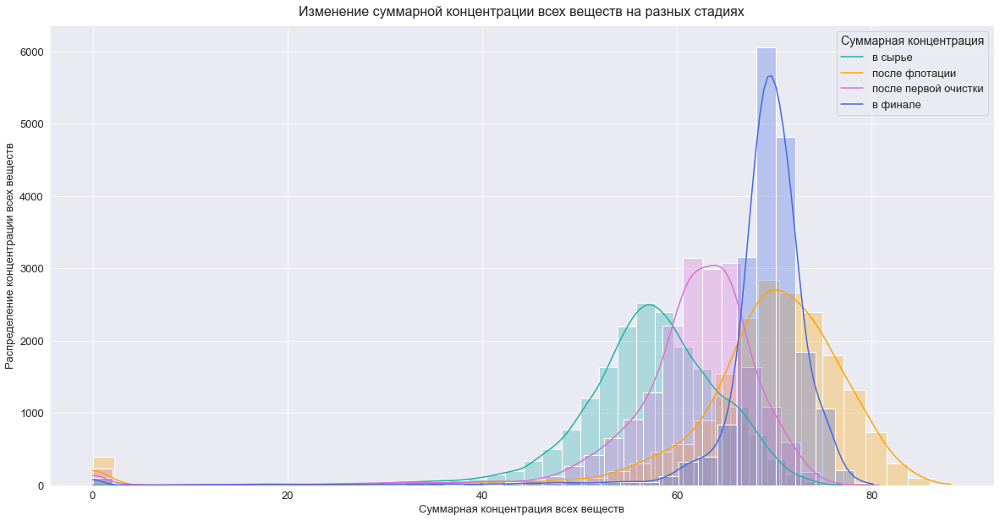

In [16]:
plt.figure(figsize=(20,10))
plt.title(f'Изменение суммарной концентрации всех веществ на разных стадиях', fontsize=16, y=1.01)


for col, c in zip(['feed_concentrate', 'rougher_concentrate', 'primary_concentrate', 'final_concentrate'],
                  ['lightseagreen', 'orange', 'orchid', 'royalblue']):   
    
    sns.histplot(data=full,
                 x=col,
                 bins=40,
                 color = c,                 
                 alpha=.3,
                 kde=True)
    
plt.legend(['в сырье','после флотации','после первой очистки','в финале'], title='Суммарная концентрация', title_fontsize = 14)
plt.xlabel('Суммарная концентрация всех веществ')
plt.ylabel('Распределение концентрации всех веществ');

Все распределения смещены влево.

Суммарная концентрация веществ после флотации увеличивается, после первого этапа уменьшается, в финале увеличивается, причём пик распределения больше, чем после флотации - интервал распределения меньше.

Видим скачки на нулевых концентрациях. Посмотрим, все ли нулевые концентрации появились в одно время. И если нет, то это явные аномалии.

Для начала взглянем на табличные данные.

#### Анализ аномалий

- Выберем признаки с суммарными концентрациями и целевые признаки.
- Отсортируем таблицы по возрастанию значений объектов в каждом признаке.

In [17]:
for col in ['feed_concentrate', 'rougher_concentrate', 'primary_concentrate', 'final_concentrate']:
    display(full[['feed_concentrate',
                  'rougher_concentrate',
                  'primary_concentrate',
                  'final_concentrate',
                  'rougher.output.recovery',
                  'final.output.recovery']].sort_values(by=col).head(10))
    print(f'\033[1m\033[4mКоличество нулевых значений в признаке "{col}": {full[full[col]==0][col].count()}')
    print(f'\033[1m\033[4mДоля нулевых значений в признаке "{col}": {(full[col]==0).mean():.1g}')

,feed_concentrate,rougher_concentrate,primary_concentrate,final_concentrate,rougher.output.recovery,final.output.recovery
date,,,,,,
2018-03-12 04:59:59,0.040000,0.040000,63.823562,68.805134,100.000000,100.000000
2018-03-12 05:59:59,0.040000,0.040000,63.823562,68.805134,100.000000,100.000000
2018-03-12 03:59:59,0.040000,0.040000,63.823562,68.805134,100.000000,100.000000
2018-03-12 06:59:59,0.040000,0.040000,49.947465,53.845297,100.000000,100.000000
2018-03-12 02:59:59,0.040000,0.040000,63.823562,68.805134,100.000000,100.000000
2016-09-02 06:59:59,4.501868,0.000000,0.000000,0.000000,0.000000,0.000000
2017-11-04 23:59:59,8.072476,18.856160,9.390157,5.945843,20.691275,75.966464
2018-03-15 16:59:59,8.217984,6.829975,18.167776,17.459617,25.005887,69.303832
2016-03-13 12:00:00,8.219283,0.000000,1.652472,4.759584,0.000000,72.707062


Количество нулевых значений в признаке "feed_concentrate": 0
Доля нулевых значений в признаке "feed_concentrate": 0


,feed_concentrate,rougher_concentrate,primary_concentrate,final_concentrate,rougher.output.recovery,final.output.recovery
date,,,,,,
2017-12-06 22:59:59,65.557895,0.0,65.380210,68.852144,0.0,76.792221
2017-06-05 13:59:59,54.786408,0.0,64.446778,68.932339,0.0,60.907221
2017-06-05 12:59:59,55.734357,0.0,63.993508,68.534993,0.0,61.968818
2017-10-23 01:59:59,64.976048,0.0,27.769665,58.082640,0.0,67.615154
2017-10-23 07:59:59,66.646097,0.0,65.756411,69.358273,0.0,76.703181
2017-10-23 08:59:59,68.287110,0.0,67.113953,69.631713,0.0,72.692692
2017-10-23 09:59:59,66.617648,0.0,67.035860,70.529153,0.0,65.632054
2017-06-05 11:59:59,54.683829,0.0,63.627421,68.555957,0.0,60.273735
2017-03-07 23:59:59,51.785935,0.0,62.432289,69.383570,0.0,61.682406


Количество нулевых значений в признаке "rougher_concentrate": 394
Доля нулевых значений в признаке "rougher_concentrate": 0.02


,feed_concentrate,rougher_concentrate,primary_concentrate,final_concentrate,rougher.output.recovery,final.output.recovery
date,,,,,,
2016-03-20 17:00:00,57.981293,58.551254,0.0,66.494937,81.810880,65.376143
2017-08-11 15:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000
2017-08-11 16:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000
2017-08-11 18:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000
2017-08-11 19:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000
2017-08-11 20:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000
2017-08-11 21:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000
2017-08-11 22:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000
2017-08-11 23:59:59,58.253792,41.115844,0.0,64.690452,83.406924,100.000000


Количество нулевых значений в признаке "primary_concentrate": 108
Доля нулевых значений в признаке "primary_concentrate": 0.006


,feed_concentrate,rougher_concentrate,primary_concentrate,final_concentrate,rougher.output.recovery,final.output.recovery
date,,,,,,
2017-12-16 23:59:59,45.043903,82.682023,22.783064,0.0,75.499299,0.0
2017-03-06 20:59:59,54.122333,73.686489,59.988074,0.0,89.572296,0.0
2017-11-30 02:59:59,67.808006,78.428633,66.059927,0.0,90.157963,0.0
2016-02-13 11:00:00,46.703740,56.574778,53.725613,0.0,68.960993,0.0
2017-10-13 13:59:59,49.538076,71.447262,52.700284,0.0,87.484721,0.0
2017-12-17 03:59:59,45.939187,81.078794,57.248049,0.0,73.847562,0.0
2016-11-19 15:59:59,47.415115,30.865627,35.175781,0.0,93.390280,0.0
2017-09-08 16:59:59,55.171761,74.011184,61.701242,0.0,84.737674,0.0
2017-10-12 20:59:59,48.272565,72.603624,40.758822,0.0,77.427432,0.0


Количество нулевых значений в признаке "final_concentrate": 98
Доля нулевых значений в признаке "final_concentrate": 0.005


Уже видно, что нулевые значения на каждом этапе нелогичны, т.к. на остальных этапах ненулевые при нулевом на конкретном этапе.
<br>Значение в исходном сырье 0.04 тоже похоже на аномалию, т.к. эффективность при таких данных - 100.

Аномальные значения концентраций (0 и 0.04) негативно влияют на будущую модель, т.к. им соответствуют аномальные значения эффективности (0 и 100).

Посмотрим на распределения параметров с ненулевыми концентрациями на различных этапах при нулевой концентрации веществ на одном из этапов. Околонулевые значения в исходном сырье отлично видны в таблице выше, их мало, визуализировать не будем.

Распределения параметра с нулевой концентрацией строить не будем, т.к. это бессмысленно, важно увидеть как распределены остальные параметры.

In [18]:
'''Нулевая концентрация после флотации и ненулевые концентрации на других этапах'''

rougher_0 = full.query('feed_concentrate>0.05 and \
                        rougher_concentrate==0 and \
                        primary_concentrate!=0 and \
                        final_concentrate!=0')

'''Нулевая концентрация после первой очистки и ненулевые концентрации на других этапах'''

primary_0 = full.query('feed_concentrate>0.05 and \
                        rougher_concentrate!=0 and \
                        primary_concentrate==0 and \
                        final_concentrate!=0')

'''Нулевая концентрация в финале и ненулевые концентрации на других этапах'''

final_0 = full.query('feed_concentrate>0.05 and \
                     rougher_concentrate!=0 and \
                     primary_concentrate!=0 and \
                     final_concentrate==0')

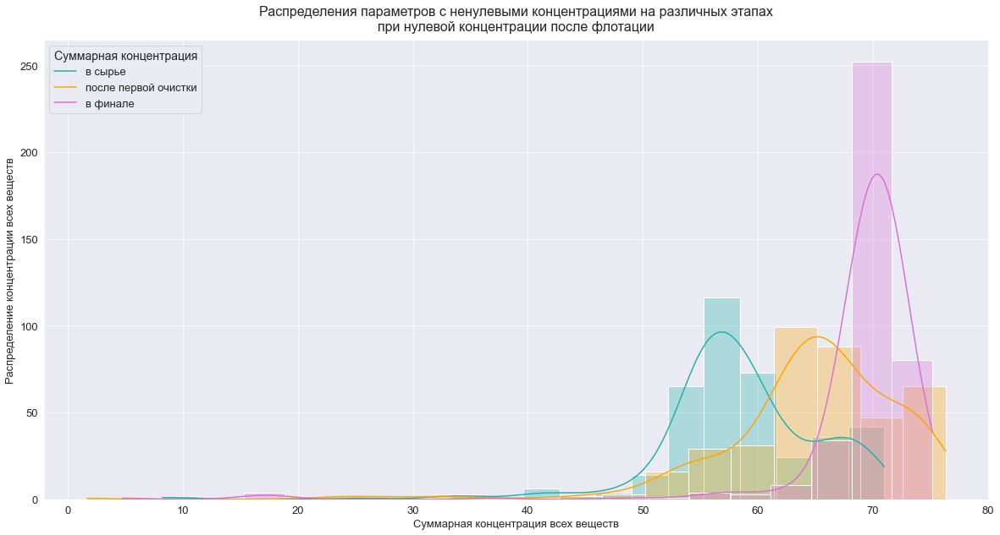

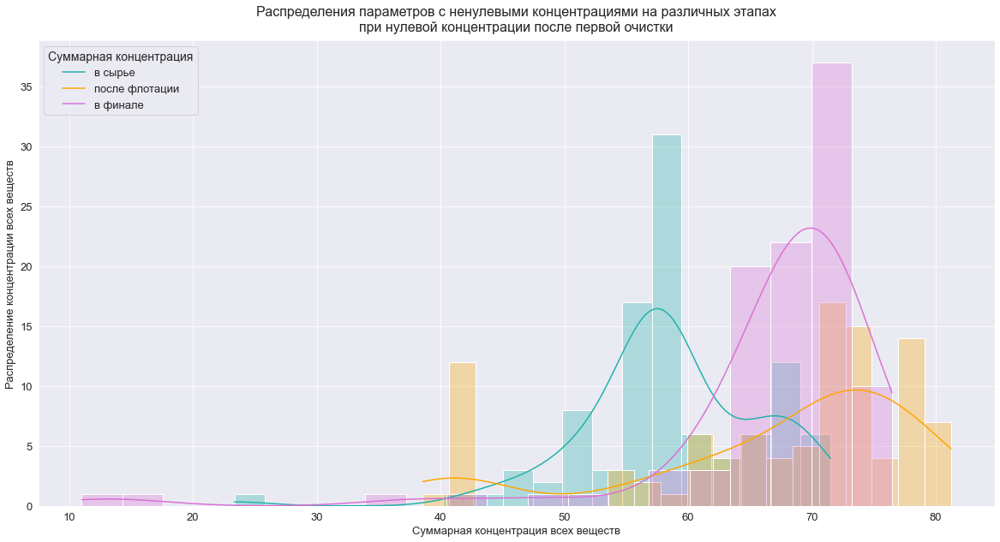

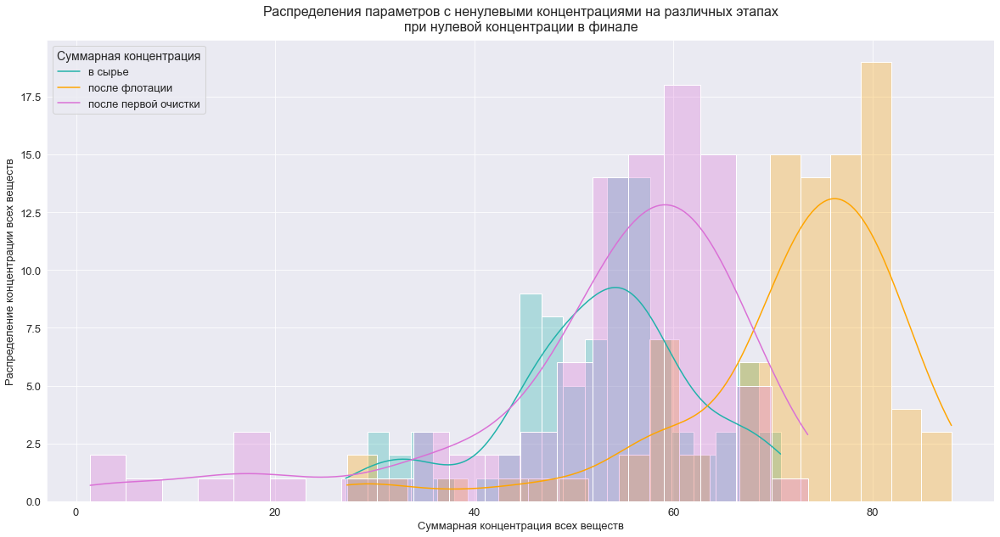

In [19]:
rougher_0_columns = ['feed_concentrate', 'primary_concentrate', 'final_concentrate']
primary_0_columns = ['feed_concentrate', 'rougher_concentrate', 'final_concentrate']
final_0_columns   = ['feed_concentrate', 'rougher_concentrate', 'primary_concentrate']

legend_rougher_0 = ['в сырье', 'после первой очистки', 'в финале']
legend_primary_0 = ['в сырье', 'после флотации', 'в финале']
legend_final_0   = ['в сырье', 'после флотации', 'после первой очистки']

for data, columns, title, legend in zip([rougher_0, primary_0, final_0],
                                        [rougher_0_columns, primary_0_columns, final_0_columns],
                                        ['после флотации','после первой очистки','в финале'],
                                        [legend_rougher_0, legend_primary_0, legend_final_0]):  
    plt.figure(figsize=(20,10))    
    
    for x, c in zip(columns,                          
                    ['lightseagreen', 'orange', 'orchid']):   
        
        sns.histplot(data=data,
                     x=x,
                     bins=20,
                     color = c,                 
                     alpha=.3,
                     kde=True)
    
    plt.title(f'Распределения параметров с ненулевыми концентрациями на различных этапах\nпри нулевой концентрации {title}',
              fontsize=16, y=1.01)
    plt.legend(legend, title='Суммарная концентрация', title_fontsize = 14)
    plt.xlabel('Суммарная концентрация всех веществ')
    plt.ylabel('Распределение концентрации всех веществ')
    plt.show()

Очевидно, что нулевые значения в концентрациях - некорректное заполнение данных, т.к. при нулевых значениях концентраций всех веществ на одном из этапов, на всех остальных этапах имеется значительное количество ненулевых значений.

Также нулевые значения негативно влияют на эффективность.

Графически подтвердили предположение, что нулевые значения это аномалии. 

#### Зависимость целевых признаков от концентраций

Напомним, с какими данными работаем:
- эффективность обогащения чернового концентрата `rougher.output.recovery`;
- эффективность обогащения финального концентрата `final.output.recovery`.

Дополнительно посмотрим зависимость эффективности (целевого признака) от концентраций.
<br>На основании информации полученной ранее предполагается, что при аномальных значениях концентраций эффективность также аномальная.

Посмотрим, какие данные присутствуют в целевых признаках при нулевых значениях концентрации

In [20]:
print(color.BOLD+color.UNDERLINE+'feed_concentrate<0.05')
display(full.query('feed_concentrate<0.05')[['rougher.output.recovery', 'final.output.recovery']])
print('количество уникальных значений в целевых признаках\n',
      full.query('feed_concentrate<0.05')[['rougher.output.recovery','final.output.recovery']].value_counts())

feed_concentrate<0.05


,rougher.output.recovery,final.output.recovery
date,,
2018-03-12 02:59:59,100.0,100.0
2018-03-12 03:59:59,100.0,100.0
2018-03-12 04:59:59,100.0,100.0
2018-03-12 05:59:59,100.0,100.0
2018-03-12 06:59:59,100.0,100.0


количество уникальных значений в целевых признаках
 rougher.output.recovery  final.output.recovery
100.0                    100.0                    5
dtype: int64


In [21]:
print(color.BOLD+color.UNDERLINE+'rougher_concentrate==0')
display(full.query('rougher_concentrate==0')[['rougher.output.recovery', 'final.output.recovery']])
print('количество уникальных значений в целевом признаке\n',
      full.query('rougher_concentrate==0')['rougher.output.recovery'].value_counts())

rougher_concentrate==0


,rougher.output.recovery,final.output.recovery
date,,
2016-01-16 21:00:00,0.0,68.403877
2016-01-16 22:00:00,0.0,70.675633
2016-01-16 23:00:00,0.0,55.088448
2016-01-17 00:00:00,0.0,41.962008
2016-01-17 02:00:00,0.0,49.884856
...,...,...
2018-02-11 23:59:59,0.0,83.597741
2018-02-12 00:59:59,0.0,84.738648
2018-02-12 01:59:59,0.0,73.519948


количество уникальных значений в целевом признаке
 0.0    394
Name: rougher.output.recovery, dtype: int64


In [22]:
display(full.query('primary_concentrate==0')[['rougher.output.recovery', 'final.output.recovery']])

,rougher.output.recovery,final.output.recovery
date,,
2016-01-15 19:00:00,86.241795,70.348300
2016-01-15 22:00:00,88.132239,69.823900
2016-01-16 06:00:00,88.066903,69.193840
2016-01-18 01:00:00,81.830028,72.437752
2016-01-18 04:00:00,76.149160,84.687443
...,...,...
2018-01-30 18:59:59,91.325269,69.768950
2018-01-30 21:59:59,91.163609,69.202697
2018-01-31 12:59:59,92.759895,72.130539


In [23]:
display(full.query('final_concentrate==0')[['rougher.output.recovery', 'final.output.recovery']])
print('количество уникальных значений в целевом признаке\n',
      full.query('final_concentrate==0')['final.output.recovery'].value_counts())

,rougher.output.recovery,final.output.recovery
date,,
2016-02-13 11:00:00,68.960993,0.0
2016-03-11 10:00:00,82.787322,0.0
2016-03-11 11:00:00,83.515262,0.0
2016-03-11 12:00:00,83.702224,0.0
2016-03-11 13:00:00,84.836821,0.0
...,...,...
2017-12-26 19:59:59,79.705229,0.0
2017-12-26 20:59:59,83.325755,0.0
2018-01-15 20:59:59,26.959908,0.0


количество уникальных значений в целевом признаке
 0.0    98
Name: final.output.recovery, dtype: int64


Видим в целевых признаках аномальные значения 0 и 100, кроме эффективностей при нулевых значениях концентраций после первичной очистки.

Посмотрим, какие данные останутся в целевых признаках, если исключить нулевые значения концентрации

In [24]:
full_clean = full.query('feed_concentrate>0.05 and \
                         rougher_concentrate!=0 and \
                         primary_concentrate!=0 and \
                         final_concentrate!=0')

<ins>эффективность обогащения чернового концентрата `rougher.output.recovery`

In [25]:
full_clean[['rougher.output.recovery']].sort_values(by='rougher.output.recovery')

,rougher.output.recovery
date,
2016-03-05 00:00:00,2.520854
2016-05-15 14:59:59,9.826876
2016-11-02 18:59:59,10.430587
2016-12-28 12:59:59,18.491446
2017-11-04 23:59:59,20.691275
...,...
2018-04-18 10:59:59,99.430390
2018-08-09 22:59:59,99.617781
2017-03-12 01:59:59,99.772958


<ins>эффективность обогащения финального концентрата `final.output.recovery`

In [26]:
full_clean[['final.output.recovery','final.output.tail_au']].sort_values(by='final.output.recovery')

,final.output.recovery,final.output.tail_au
date,,
2018-05-15 04:59:59,0.168611,2.452356
2018-05-02 17:59:59,0.430264,0.886103
2016-03-02 11:00:00,0.463711,4.115341
2017-12-12 00:59:59,2.030917,3.705096
2016-01-30 16:00:00,2.080672,8.197408
...,...,...
2016-11-17 15:59:59,100.000000,0.000000
2017-12-17 06:59:59,100.000000,0.000000
2017-12-17 05:59:59,100.000000,0.000000


In [27]:
for dataset in ['full', 'train', 'test']:
    print(f'\033[1m\033[4mДатасет {dataset}\033[0m')
    for output_recovery in ['rougher.output.recovery','final.output.recovery']:  
        print(f'количество объектов со 100% эффективноcтью в целевом признаке {output_recovery}:\
 {locals()[dataset][locals()[dataset][output_recovery]==100].shape[0]}')

Датасет full
количество объектов со 100% эффективноcтью в целевом признаке rougher.output.recovery: 5
количество объектов со 100% эффективноcтью в целевом признаке final.output.recovery: 91
Датасет train
количество объектов со 100% эффективноcтью в целевом признаке rougher.output.recovery: 5
количество объектов со 100% эффективноcтью в целевом признаке final.output.recovery: 75
Датасет test
количество объектов со 100% эффективноcтью в целевом признаке rougher.output.recovery: 0
количество объектов со 100% эффективноcтью в целевом признаке final.output.recovery: 16


&emsp;Видим некоторое количество 100 процентной эффективности обогащения финального концентрата даже после исключения нулевых значений концентраций.
<br>&emsp;Стопроцентная эффективность достигнута засчёт нулевых значений в долях золота в отвальных хвостах. Идеальный результат, который в реальной жизни достичь невозможно. Скорее всего, есть некоторое ограничение измерений, при котором произошло округление данных. 
<br>&emsp;Для дальнейшего создания модели удалим аномалии, связанные с нулевой и стопроцентной эффективностями.

#### Удаление аномальных значений

Для удобства создадим новые отфильтрованные от аномалий датафреймы

In [28]:
for sample in ['full','train','test']:
    
    locals()[f'{sample}_new'] = locals()[sample][~((locals()[sample]['rougher.output.recovery'].isin([0,100])) |
                                                   (locals()[sample]['final.output.recovery'].isin([0,100])))]

Посмотрим, какой процент данных мы отфильтровали.

In [29]:
print(f'Процент удаленных исходных данных:             {1-len(full_new)/len(full):.2%}')
print(f'Процент удаленных данных из обучающей выборки: {1-len(train_new)/len(train):.2%}')
print(f'Процент удаленных данных из тестовой выборки:  {1-len(test_new)/len(test):.2%}')

Процент удаленных исходных данных:             2.98%
Процент удаленных данных из обучающей выборки: 3.02%
Процент удаленных данных из тестовой выборки:  2.87%


Данных потеряно немного в пользу качества модели.

### Распределение данных в целевых признаках

Посмотрим на распределение данных в целевых признаках после удаления аномальных значений.

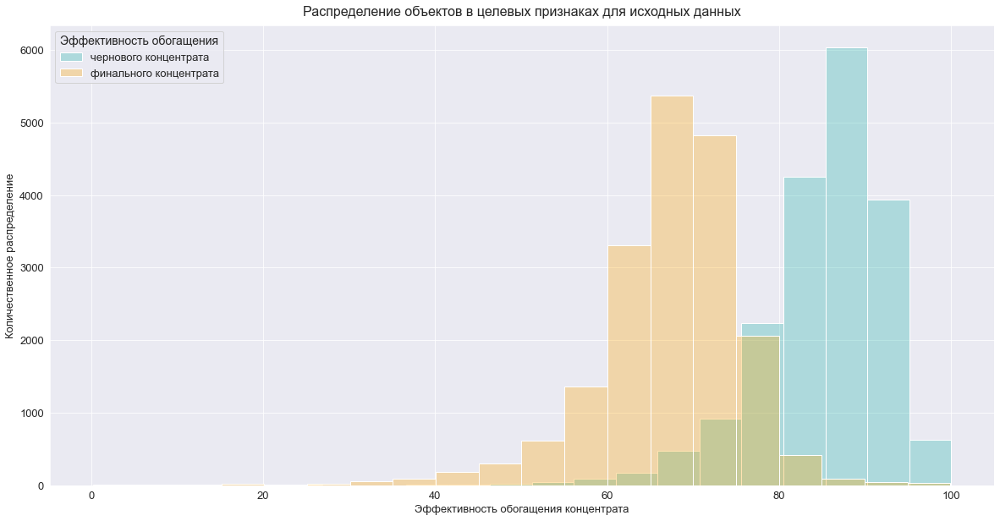

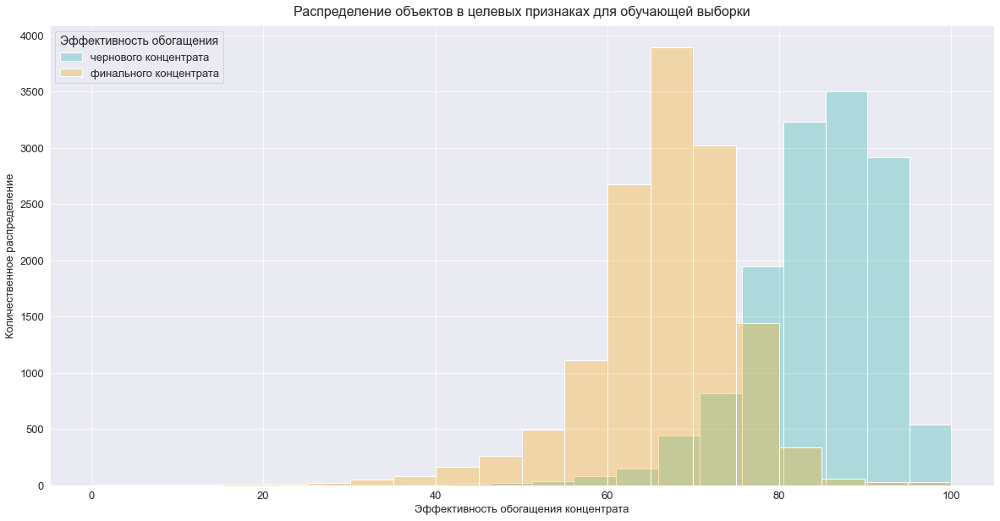

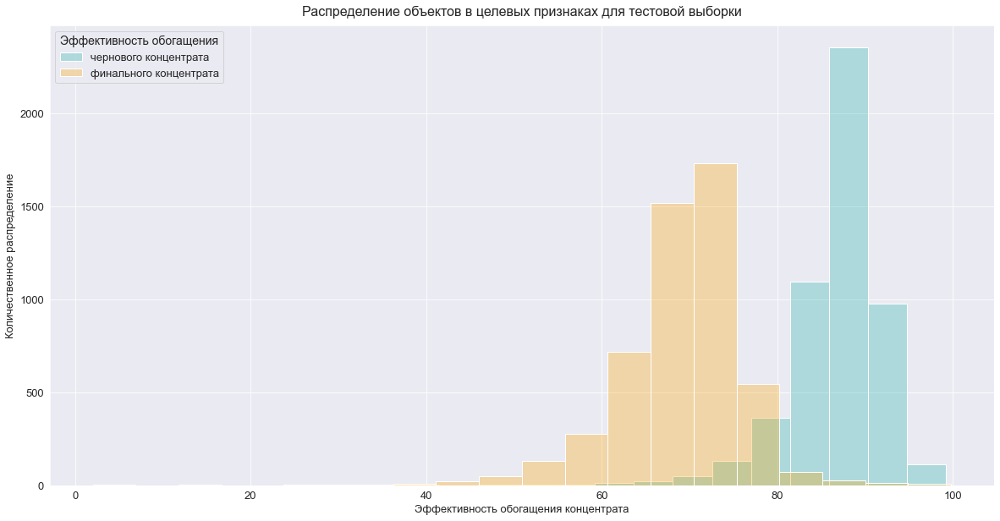

In [30]:
for data, title in zip([full_new, train_new, test_new],
                       ['исходных данных', 'обучающей выборки', 'тестовой выборки']):
    
    plt.figure(figsize=(20,10))
    
    for recovery, c in zip(['rougher.output.recovery', 'final.output.recovery'],
                           ['lightseagreen', 'orange']):
        
        sns.histplot(data=data,
                     x=recovery,
                     bins=20,
                     color=c,
                     alpha=.3)        
        
    plt.title(f'Распределение объектов в целевых признаках для {title}',
              fontsize=16, y=1.01)
    plt.legend(['чернового концентрата', 'финального концентрата'],
               title='Эффективность обогащения',
               title_fontsize = 14,
               loc='upper left')
    plt.xlabel('Эффективность обогащения концентрата')
    plt.ylabel('Количественное распределение')
    plt.show()

- Распределения смещены влево.
- Эффективность обогащения уменьшается от чернового концентрата к финальному.

### Исследование зависимостей между признаками

Исследуем все объекты для обучающей и тестовой выборок по признакам, содержащимся в них.

Для этого отфильтруем датафрейм `full_new` по признакам обучающей выборки `train_new`.

In [31]:
full_relation = full_new[train_new.columns]

Сохраним матрицу коэффициентов `phik` в отдельную переменную `phik_overview`

In [32]:
phik_overview = full_relation.phik_matrix(full_relation.columns)

Посмотрим на минимальные значения коэффициента phik и корреляции Пирсона между признаками и целевыми признаками

In [33]:
print(f'Минимум коэффициента Phik признаков с {phik_overview[["rougher.output.recovery"]].min().round(3)}')
print(f'Минимум корреляции Пирсона признаков с {full_relation.corr()[["rougher.output.recovery"]].min().round(3)}')
print(f'Минимум коэффициента Phik признаков с {phik_overview[["final.output.recovery"]].min().round(3)}')
print(f'Минимум корреляции Пирсона признаков с {full_relation.corr()[["final.output.recovery"]].min().round(3)}')

Минимум коэффициента Phik признаков с rougher.output.recovery    0.065
dtype: float64
Минимум корреляции Пирсона признаков с rougher.output.recovery   -0.325
dtype: float64
Минимум коэффициента Phik признаков с final.output.recovery    0.067
dtype: float64
Минимум корреляции Пирсона признаков с final.output.recovery   -0.182
dtype: float64


Построим тепловые карты взаимосвязей, установив единую размерность путём передачи параметру `vmin` минимального значения из всех коэффициентов.

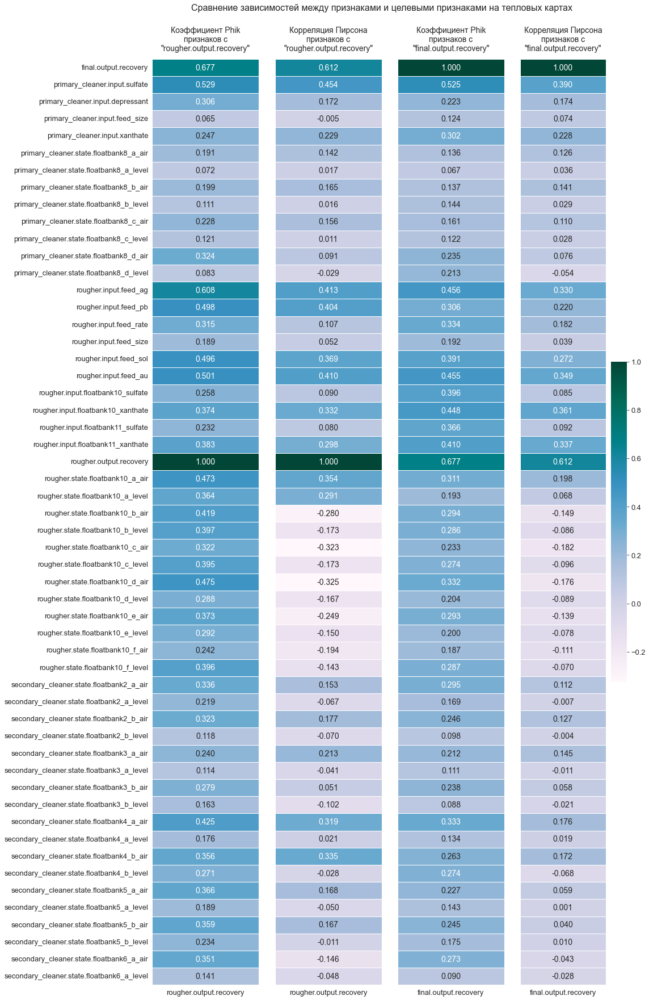

In [34]:
fig, ax = plt.subplots(1,4,figsize=(15,30))

fig.subplots_adjust(wspace=.15)

fig.suptitle('Сравнение зависимостей между признаками и целевыми признаками на тепловых картах', y = .925, fontsize = 16)

for i, df, title, cbar, yticklabels  in zip(
                                            range(4),
                                            
                                            [phik_overview[['rougher.output.recovery']],
                                             full_relation.corr()[['rougher.output.recovery']],
                                             phik_overview[['final.output.recovery']],
                                             full_relation.corr()[['final.output.recovery']]],
                                               
                                            ['Коэффициент Phik\nпризнаков с\n"rougher.output.recovery"',
                                            'Корреляция Пирсона\nпризнаков с\n"rougher.output.recovery"',
                                            'Коэффициент Phik\nпризнаков с\n"final.output.recovery"',
                                            'Корреляция Пирсона\nпризнаков с\n"final.output.recovery"'],
                                            
                                            [False, False, False, True],
                        
                                            [True, False, False, False]
                                           ):    
    sns.heatmap(df,
                annot=True,
                annot_kws={"size": 14},
                fmt= '.3f',
                ax=ax[i],
                cmap='PuBuGn',
                cbar=cbar,
                yticklabels=yticklabels,
                vmin=full_relation.corr()[['rougher.output.recovery']].min(),
                linewidths=.5)
    
    ax[i].set_title(f'{title}', fontsize = 14, y=1.005);

- Видим, что линейные взаимосвязи слабее нелинейных.
- Эффективности средне зависят друг друга, но для построения модели мы исключили оба целевых признака из фичей, т.к. обе эффективности рассчитываются через параметры, указанные в признаках.
- Более корректно исследовать зависимости в данных по коэффициенту `phik`, т.к. он учитывает и нелинейные взаимосвязи в данных, в отличие от `корреляции Пирсона`.
- Взаимосвязи в данных средние и ниже.

<ins>Медианные значения взаимосвязей:

In [35]:
print(f'Медиана коэффициента Phik признаков с {phik_overview[["rougher.output.recovery"]].median().round(3)}')
print(f'Медиана корреляции Пирсона признаков с {full_relation.corr()[["rougher.output.recovery"]].median().round(3)}')
print(f'Медиана коэффициента Phik признаков с {phik_overview[["final.output.recovery"]].median().round(3)}')
print(f'Медиана корреляции Пирсона признаков с {full_relation.corr()[["final.output.recovery"]].median().round(3)}')

Медиана коэффициента Phik признаков с rougher.output.recovery    0.311
dtype: float64
Медиана корреляции Пирсона признаков с rougher.output.recovery    0.066
dtype: float64
Медиана коэффициента Phik признаков с final.output.recovery    0.241
dtype: float64
Медиана корреляции Пирсона признаков с final.output.recovery    0.059
dtype: float64


<ins>Посмотрим на взаимосвязи между признаками, исключив из матриц взаимосвязей целевые признаки.

- На столбчатых диаграммах построим максимальные и медианные значения коэффициента Phik и корреляции Пирсона для каждого признака. Для удобства понимания среднего значения добавим на график вспомогательную горизонтальную линию на отметке 0.5 по оси y.

Исключение целевых признаков из матриц взаимосвязей.

In [36]:
phik_overview_features = phik_overview.drop(columns=['rougher.output.recovery', 'final.output.recovery'],
                                            index=['rougher.output.recovery', 'final.output.recovery'])

corr_features = full_relation.corr().drop(columns=['rougher.output.recovery', 'final.output.recovery'],
                                          index=['rougher.output.recovery', 'final.output.recovery'])

Построение графиков.

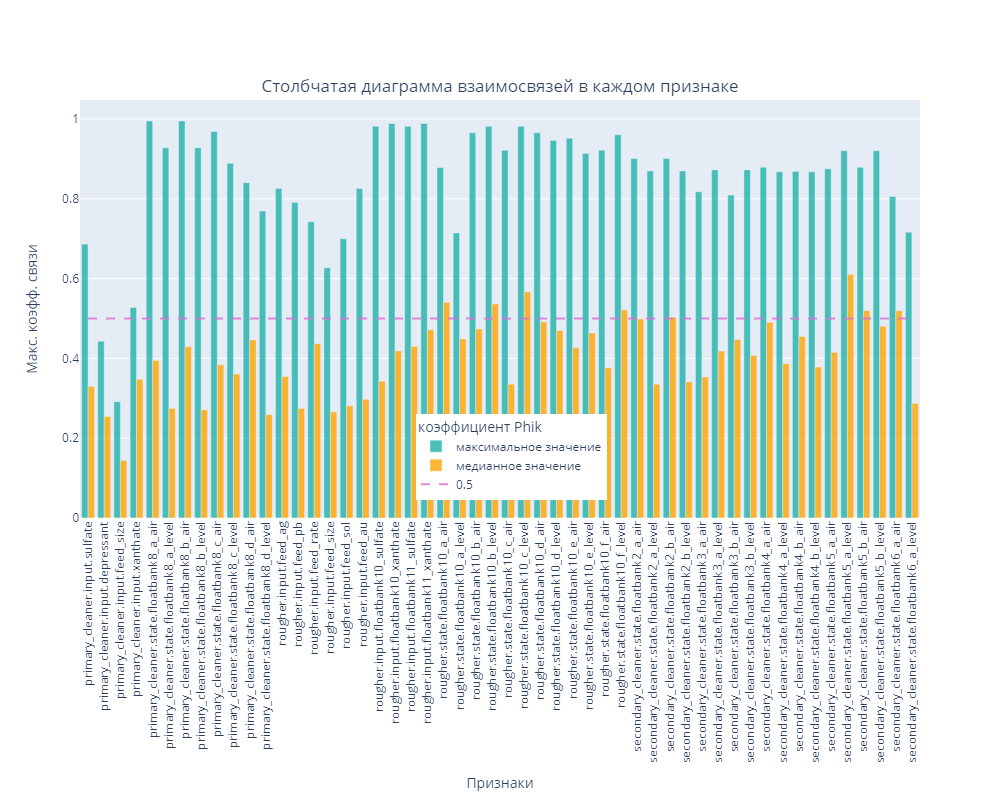

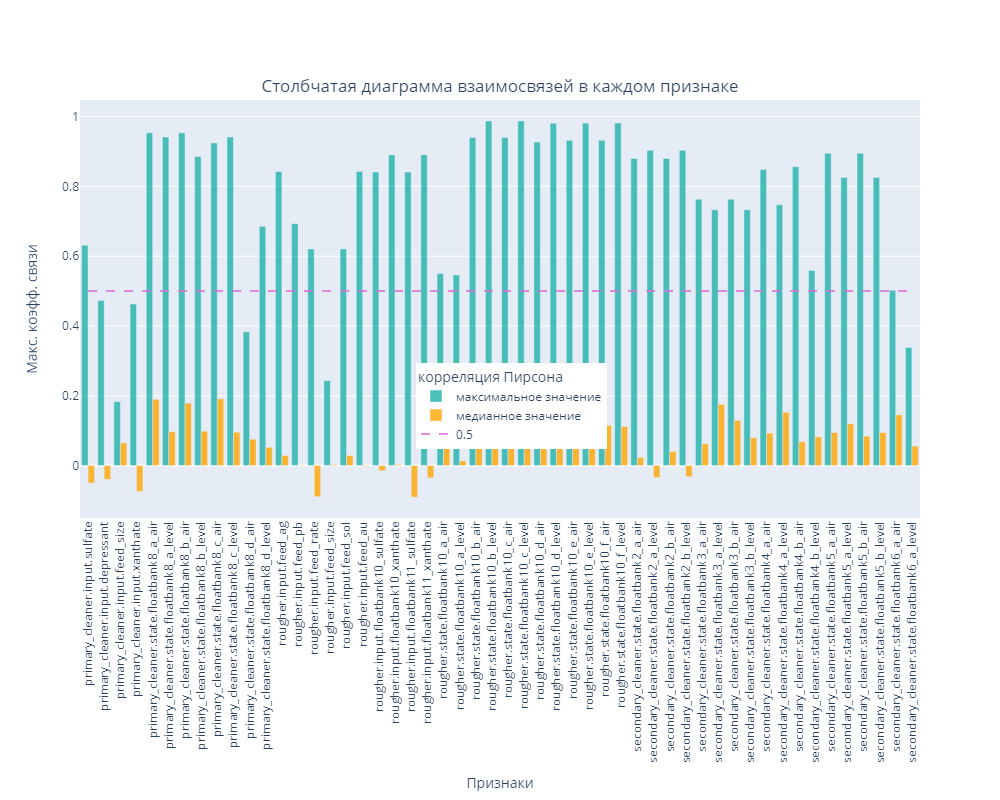

In [37]:
for df, y_legend, coefficient in zip([phik_overview_features, corr_features],
                                     (0.25, 0.37),
                                    ('коэффициент Phik', 'корреляция Пирсона')):

    layout = go.Layout(autosize=False,
                       width=1000,
                       height=800)
    
    fig = go.Figure(data=[go.Bar(x=df.columns,
                                 y=[df[col].sort_values(ascending=False)[1] for col in list(df.columns)],
                                 opacity=0.8,
                                 name='максимальное значение',
                                 marker=dict(color='lightseagreen')),
                          go.Bar(x=df.columns,
                                 y=[df[col].median() for col in list(df.columns)],
                                 opacity=0.8,
                                 name='медианное значение',
                                 marker=dict(color='orange')),
                          go.Scatter(x=df.columns,
                                     y=[0.5]*len(df.columns),
                                     line=dict(color='orchid', dash='dash'),
                                     opacity=0.8,
                                     name='0.5')],              
                          layout=layout)
    
    fig.update_layout(title={'text': 'Столбчатая диаграмма взаимосвязей в каждом признаке',
                             'y':0.9,
                             'x':0.5,
                             'xanchor': 'center',
                             'yanchor': 'top'},
                      
                      xaxis_title='Признаки',
                      yaxis_title='Макс. коэфф. связи',
                      legend_title=coefficient,                  
                      showlegend=True,
                      legend=dict(yanchor="top", y=y_legend, xanchor="left", x=0.4))
    
    fig.update_xaxes(tickangle=-90)
    
    fig.show('png')

- Основная масса признаков зависят друг от друга на уровне ниже среднего.
- Большинство признаков имеют высокий коэффициент взаимосвязи не менее, чем с одним из других признаков.

Наблюдения выше могут сказаться на качестве модели. Проверим далее.

## Построение модели

### Создание переменных для признаков и целевых признаков

Создадим функцию `variables_signs()`,
<br>принимающую на вход:
- `selection` - выборку.
<br>На выходе функции:
- `target_rougher` - целевой признак 1 - эффективность обогащения чернового концентрата
- `target_final` - целевой признак 2 - эффективность обогащения финального концентрата
- `features` - признаки

In [38]:
def variables_signs(selection):    
    target_rougher = selection['rougher.output.recovery']
    target_final = selection['final.output.recovery']    
    features = selection.drop(['rougher.output.recovery', 'final.output.recovery'] , axis=1)
    return target_rougher, target_final, features

Создадим переменные для признаков и целевых признаков для обучающей и тестовой выборок

In [39]:
target_rougher_train, target_final_train, features_train = variables_signs(train_new)
target_rougher_test, target_final_test, features_test = variables_signs(test_new)

### Проверка результатов деления на выборки

Проверка результатов деления на выборки

размер выборки target_rougher_train : (13721,)
размер выборки target_final_train : (13721,)
размер выборки features_train : (13721, 52)
размер выборки target_rougher_test : (5138,)
размер выборки target_final_test : (5138,)
размер выборки features_test : (5138, 52)


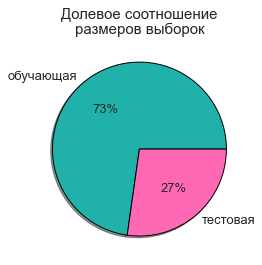

In [40]:
print(color.BOLD+color.UNDERLINE+'Проверка результатов деления на выборки\n'+color.END)
for col in ['target_rougher_train', 'target_final_train', 'features_train',
            'target_rougher_test', 'target_final_test', 'features_test']:
    print(f'размер выборки {col} : {locals()[col].shape}')
    
selections = pd.Series({'обучающая': len(train_new),
                        'тестовая': len(test_new)})

fig = plt.figure(figsize=(10, 4))

pie_selections=selections.plot(kind='pie',
                               label='',
                               autopct='%1.0f%%',
                               title='Долевое соотношение\nразмеров выборок',
                               shadow=True,
                               wedgeprops={'lw':1, 'ls':'-','edgecolor':"k"},
                               colors = ['lightseagreen', 'hotpink', 'gold'],
                               fontsize=13)
pie_selections.title.set_size(15)

Соотношение размеров выборое адекватно для обучения и проверки.

### Распределение данных в целевых признаках по дате

Для изучения распределение данных в целевых признаках по дате построим точечные диаграммы

In [41]:
data_tar = []

In [42]:
for tar, col in zip(['target_rougher_train', 'target_rougher_test', 'target_final_train', 'target_final_test'],
                    ['lightseagreen', 'orange', 'orchid', 'royalblue']):
    
    locals()[f'{tar}_fig'] = go.Scatter(x=locals()[tar].index,
                                        y=locals()[tar],
                                        mode='markers',
                                        opacity=0.8,
                                        name=tar,
                                        marker=dict(color=col, opacity=0.3))
    data_tar.append(locals()[f'{tar}_fig'])

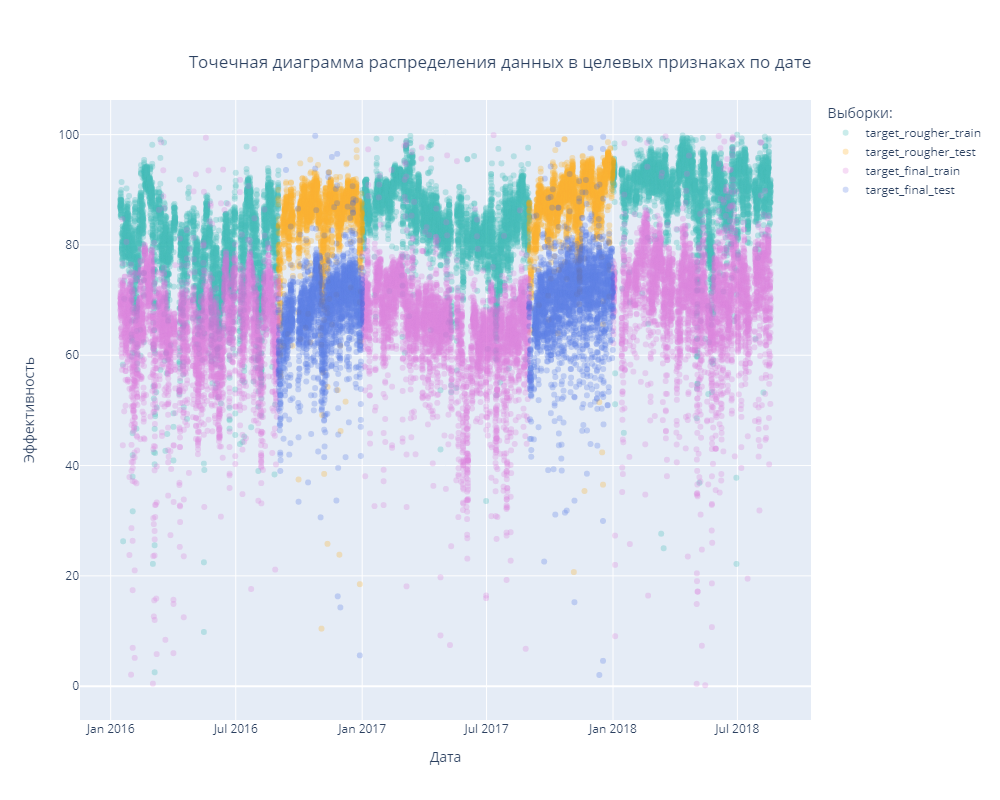

In [43]:
layout = go.Layout(autosize=False,
                   width=1000,
                   height=800)

fig = go.Figure(data=data_tar, layout=layout)

fig.update_layout(title={'text': 'Точечная диаграмма распределения данных в целевых признаках по дате',
                         'y':0.93,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  
                  xaxis_title='Дата',
                  yaxis_title='Эффективность',
                  legend_title='Выборки:')

fig.show('png')

- Обучающая и тестовая выборка отличаются не только размерами, но временными промежутками.
- В целевом признаке `rougher` эффективность выше, чем в `final` - с каждым этапом эффективность уменьшается.

### Масштабирование признаков

#### Проверка масштаба

Для начала убедимся, что у признаков разный масштаб графически на точечной диаграмме.

Напишем функцию `scaling_plot()`, т.к. действие будет повторяться.
- На вход фунция ничего не принимает, на выходе ничего не возвращает, служит для визуализации разброса значений объектов по признакам.

In [44]:
def scaling_plot():
    selection = [features_train, features_test]
    title = ['Разброс значений объектов по признакам для обучающей выборки',
             'Разброс значений объектов по признакам для тестовой выборки']
    
    for i in range(2):
    
        fig, ax = plt.subplots(figsize=(20,10))
        
        for column in list(selection[i].columns):
            ax.scatter([column]*len(selection[i]), selection[i][column], alpha=.7, linewidth=7, s = 1)
        
        ax.set_xlabel('Признаки', fontsize=15)
        ax.set_ylabel('Объекты', fontsize=15)
        plt.title(title[i], fontsize=15, y=1.03)
        plt.xticks(rotation = 90)
        plt.rcParams['font.size'] = '13'
        plt.show()

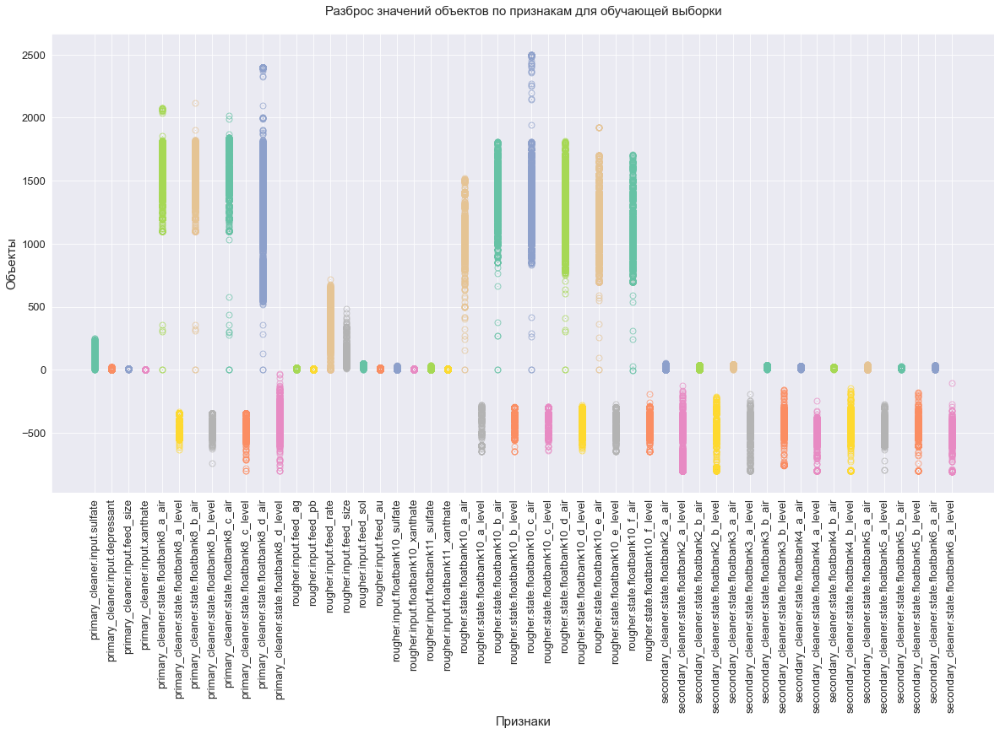

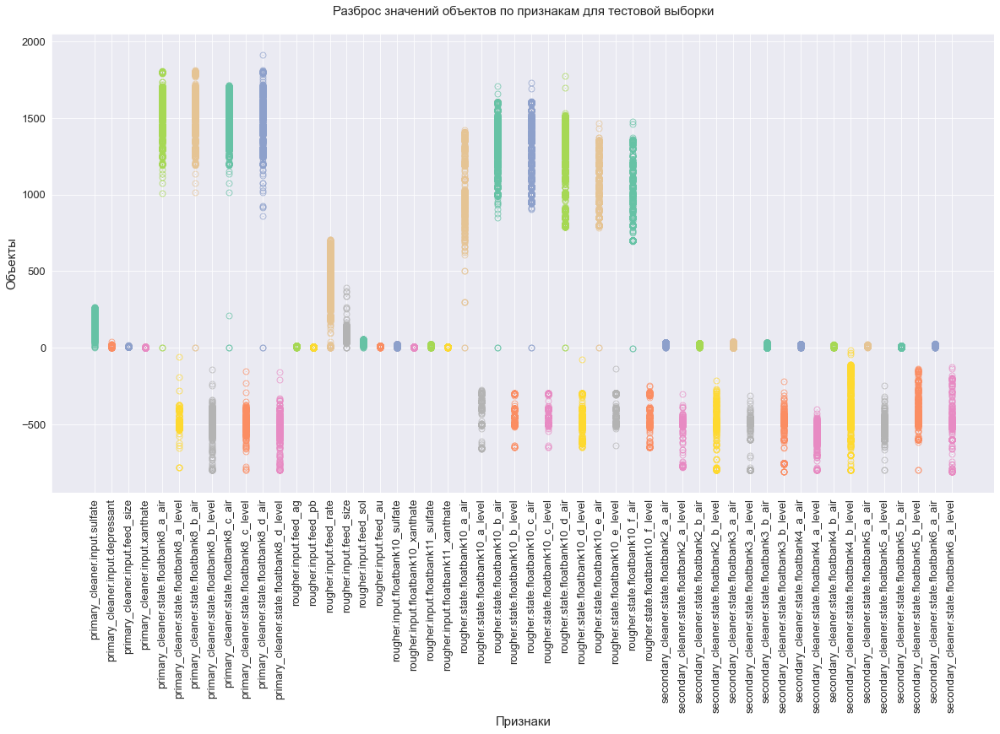

In [45]:
scaling_plot()

Т.к. у признаков разный масштаб, необходимо их стандартизировать - привести к одному масштабу.

#### Масштабирование

Выполним масштабирование признаков.

In [46]:
numeric = list(features_train.columns)

scaler = StandardScaler()
scaler.fit(features_train[numeric])
features_train[numeric] = scaler.transform(features_train[numeric])
features_test[numeric] = scaler.transform(features_test[numeric])

#### Проверка результатов масштабирования на точечной диаграмме

Проверим результаты масштабирования на точечной диаграмме.

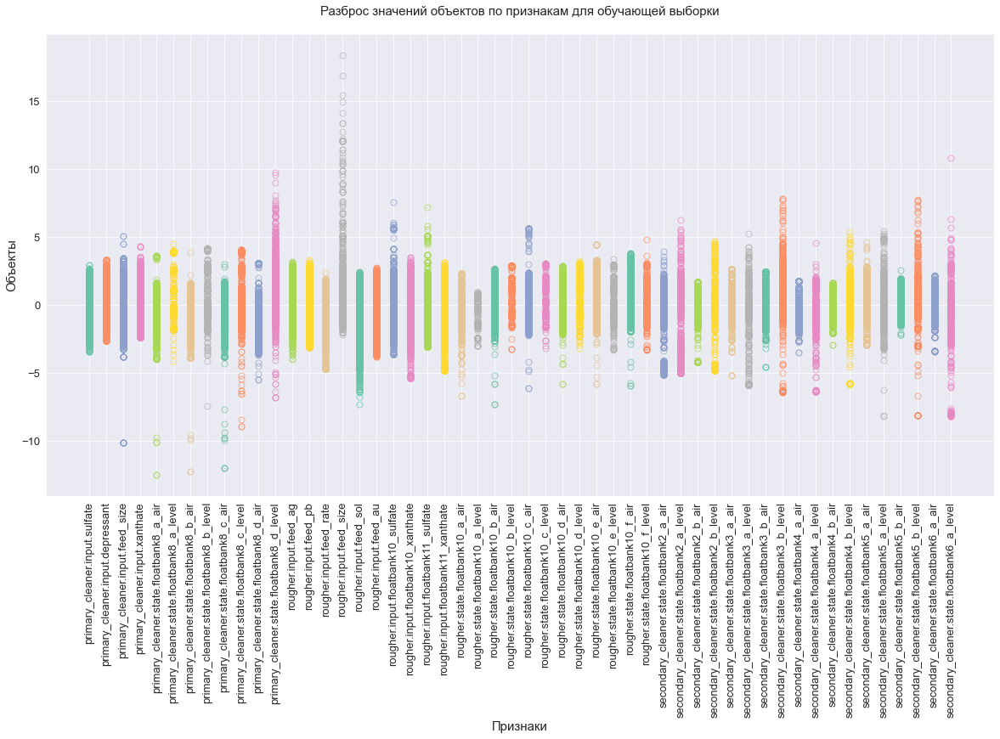

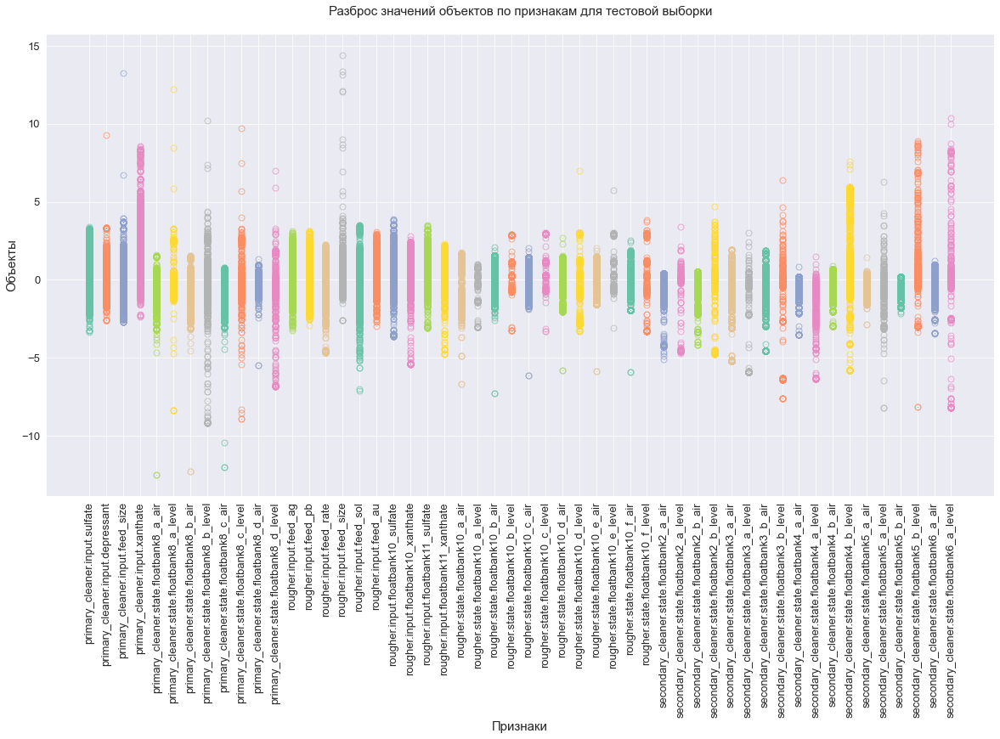

In [47]:
scaling_plot()

#### Проверка результатов масштабирования на тепловой карте

Посмотрим на результаты масштабирования на тепловой карте общего датасета, содержащего и обучающую и тестовую выборки.

##### Создание общего датасета для проверки

In [48]:
features = features_train.merge(features_test, on=list(features_train.columns), how='outer')

##### Создание датасета с категоризацией объектов в признаках

In [49]:
features_category = features.copy()

In [50]:
for col in list(features_category.columns):
    features_category[f'{col}_category'] = pd.cut(features_category[col],
                                                  [-float('inf'),-15,-10,-7.5,-5,-2.5,0,2.5,5,7.5,10,20,float('inf')])

##### Выбор категориальных признаков

In [51]:
features_category = features_category.loc[:,
                                          'primary_cleaner.input.sulfate_category':
                                          'secondary_cleaner.state.floatbank6_a_level_category']

##### Приведение категориальных признаков к змеиному регистру

Приведём наименования столбцов в `features_train_category` к змеиному регистру при помощи регулярных выражений

In [52]:
features_category.columns = [re.sub(r'(\.)', '_', i).lower() for i in features_category.columns]

##### Формирование сводных таблиц с подсчётом количества значений по категориям

In [53]:
'''Создание отдельных таблиц с категориями для каждого признака'''

for col in list(features_category.columns):
    
    locals()[col] = features_category.groupby(col)[[col]].agg('count')
    locals()[col].index.names = ['category']

'''Объединение отдельных таблиц с категориями для каждого признака в общую'''

features_category_join = pd.DataFrame(index=primary_cleaner_input_sulfate_category.index)

for col in list(features_category.columns):
    
    features_category_join = features_category_join.join(locals()[col])
    
print(f'размер категориальной сводной таблицы: {features_category_join.shape}')

размер категориальной сводной таблицы: (12, 52)


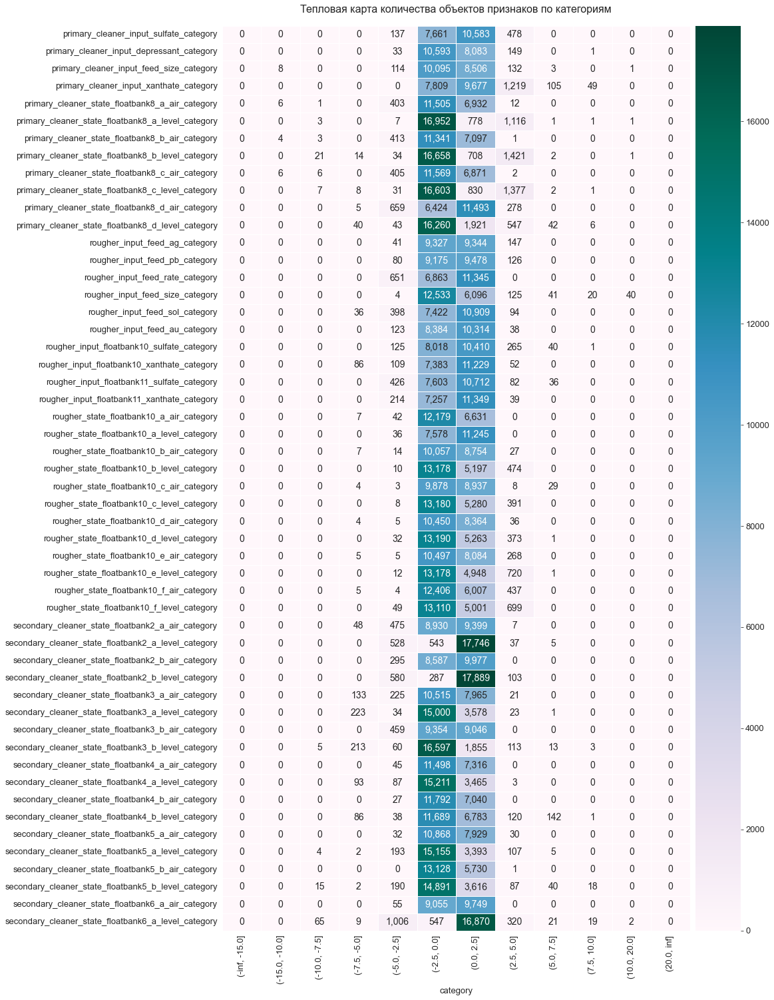

In [54]:
plt.figure(figsize=(15,25))
plt.title(f'Тепловая карта количества объектов признаков по категориям', fontsize=16, y=1.01)

sns.heatmap(features_category_join.T,
            annot=True,
            annot_kws={'size': 14},
            fmt= ',',
            cmap='PuBuGn',
            cbar_kws={'pad':0.01},
            linewidths=.5);

- Запятые в числах на тепловой карте служат для выделения количество тысяч - для удобства восприятия.
- Смасштабированные данные в основном сосредоточены в диапазоне от -2.5 до 2.5.
- Абсолютно все объекты признаков находятся в диапазоне от -15.0 до 20.0.
- Можно проследить распределение данных близкое к нормальному.

Признаки приведены к одному масштабу.

### Функция для вычисления итоговой sMAPE

Метрика качества sMAPE (англ. Symmetric Mean Absolute Percentage Error, «симметричное среднее абсолютное процентное отклонение») вычисляется так:

$sMAPE=\large{\frac 1N}{\sum_{i=1}^N} \Large\frac{|y_i-ŷ_i|}{(|y_i|+|ŷ_i|)/2}\small\cdot100\%\qquadФормула\,(1)$      

где:

${\large y_i}$ - значение целевого признака для объекта с порядковым номером i в выборке, на которой измеряется качество

${\large ŷ_i}$ - значение предсказания для объекта с порядковым номером i, например, в тестовой выборке

${\large N}$ - количество объектов в выборке

${\large \sum_{i=1}^N}$ - cуммирование по всем объектам выборки (i меняется от 1 до N)

<br>Целевые признаки:

- эффективность обогащения чернового концентрата `rougher.output.recovery`;
- эффективность обогащения финального концентрата `final.output.recovery`.

Итоговая метрика складывается из двух величин:

$\large \binom{итоговое}{sMAPE}\small=25\% \cdot sMAPE(rougher)+75\% \cdot sMAPE(final)\qquadФормула\,(2)$

Функция `sMAPE()`

на вход принимает:
- `y` - значение целевого признака
- `ŷ` - значение предсказания

на выходе:
- метрика `sMAPE`, рассчитанная по формуле (1), приведенной выше.

In [55]:
def sMAPE(y:'target', ŷ:'prediction'):
    return 100/len(y) * ( 2 * abs(y - ŷ)/(abs(y) + abs(ŷ)) ).sum()

Функция `sMAPE_total()`

на вход принимает:
- `y_r` - значение целевого признака `rougher`
- `ŷ_r` - значение предсказания `rougher`
- `y_f` - значение целевого признака `final`
- `ŷ_r` - значение предсказания `final`

на выходе:
- метрика `sMAPE_total`, рассчитанная по формуле (2), приведенной выше.

In [56]:
def sMAPE_total(y_r:'target_rougher', ŷ_r:'prediction_rougher', y_f:'target_final', ŷ_f:'prediction_final'):
    
    sMAPE_r = 100/len(y_r) * ( 2 * abs(y_r - ŷ_r)/(abs(y_r) + abs(ŷ_r)) ).sum()
    
    sMAPE_f = 100/len(y_f) * ( 2 * abs(y_f - ŷ_f)/(abs(y_f) + abs(ŷ_f)) ).sum()
    
    return .25*sMAPE_r + .75*sMAPE_f

### Baseline (исходная точка)

Протестируем функцию на константных моделях для обучающих и тестовых выборок:
- из средних значений,
- из медиан.

Константные модели создадим из средних и медиан именно обучающей выборки, т.к. значения тестовой выборки модели неизвестны.
<br>Напомним имена переменных целевых признаков:
- `target_rougher_train`
- `target_final_train`
- `target_rougher_test`
- `target_final_test`

Минимальное значение из полученных метрик (для средних значений или медиан) принимаем за исходную точку (baseline).
<br>При превышении метрики модели baseline модель признаётся невменяемой.

In [57]:
pred_rougher_train_mean = pd.Series(target_rougher_train.mean(), index=target_rougher_train.index)
pred_final_train_mean = pd.Series(target_final_train.mean(), index=target_final_train.index)

pred_rougher_train_median = pd.Series(target_rougher_train.median(), index=target_rougher_train.index)
pred_final_train_median = pd.Series(target_final_train.median(), index=target_final_train.index)

'''Для тестовой выборке предсказываем средними значениями и медианами из обучающей выборки'''

pred_rougher_test_mean = pd.Series(target_rougher_train.mean(), index=target_rougher_test.index)
pred_final_test_mean = pd.Series(target_final_train.mean(), index=target_final_test.index)

pred_rougher_test_median = pd.Series(target_rougher_train.median(), index=target_rougher_test.index)
pred_final_test_median = pd.Series(target_final_train.median(), index=target_final_test.index)

In [58]:
baseline_sMAPE_train = pd.DataFrame({
'sMAPE_rougher':[sMAPE(target_rougher_train, pred_rougher_train_mean),
                 sMAPE(target_rougher_train, pred_rougher_train_median)],
'sMAPE_final':[sMAPE(target_final_train, pred_final_train_mean),
                 sMAPE(target_final_train, pred_final_train_median)],                               
'sMAPE_total':[sMAPE_total(target_rougher_train, pred_rougher_train_mean, target_final_train, pred_final_train_mean),                              
               sMAPE_total(target_rougher_train, pred_rougher_train_median, target_final_train, pred_final_train_median)]                              
                              },                              
index=['train_mean',
       'train_median'])

baseline_sMAPE_test = pd.DataFrame({
'sMAPE_rougher':[sMAPE(target_rougher_test, pred_rougher_test_mean),
                 sMAPE(target_rougher_test, pred_rougher_test_median)],
'sMAPE_final':[sMAPE(target_final_test, pred_final_test_mean),
               sMAPE(target_final_test, pred_final_test_median)],                               
'sMAPE_total':[sMAPE_total(target_rougher_test, pred_rougher_test_mean, target_final_test, pred_final_test_mean),                              
               sMAPE_total(target_rougher_test, pred_rougher_test_median, target_final_test, pred_final_test_median)]                              
                              },                              
                              index=['test_mean',
                                     'test_median'])

Значения `sMAPE` для проверки на этапе кросс-валидации.

In [59]:
baseline_sMAPE_train.round(2)

,sMAPE_rougher,sMAPE_final,sMAPE_total
train_mean,7.34,10.10,9.41
train_median,7.28,10.04,9.35


Значения `sMAPE` для проверки на этапе проверки на тестовой выборке.

In [60]:
baseline_sMAPE_test.round(2)

,sMAPE_rougher,sMAPE_final,sMAPE_total
test_mean,5.38,8.57,7.78
test_median,4.82,8.13,7.31


### Обучение моделей

Качество моделей будем проверять на нескольких случайно сформированных выборках при помощи кросс-валидации.

Для этого:
- тестовую выборку «прячем» для финальной проверки;
- обучающую выборку случайным образом делим на K равных частей (метод деления называется K-Fold, где К — это число блоков (англ. folds));
- каждая часть становится валидационной выборкой на одном из К этапов кросс-валидации, остальные части - обучающими,
- каждый раз новая часть становится валидационной выборкой,
- среднее всех оценок, полученных в ходе кросс-валидации, — это и есть оценка качества модели.

Для реализации кросс-валидации будем использовать функцию `cross_val_score` из библиотеки `sklearn`.

Функция `cross_val_score()` возвращает список оценок качества моделей. Для вычисления качества необходимо к результатам применить функцию `mean()`

Передадим в функцию `cross_val_score()` следующие параметры:
- `model` - модель для кросс-валидации, она обучается в ходе перекрёстной проверки, поэтому на вход подаётся необученной,
- `features_train` - признаки обучающей выборки
- `target_rougher_train` или `target_final_train` - целевой признак
- `scoring` - метрика качества - будет передавать написанную ранее функцию `sMAPE` через функцию `make_scorer()`, т.к. функция `sMAPE` отсутствует в значениях параметра `scoring`

#### Модели с изменяемыми параметрами

<ins>Создадим функцию `sMAPE_metrics()`.<ins/>

На входе функции:
- `model_name` - наименование модели регрессии
- `parameter_change` - наименование изменяемого гиперпараметра
- `parameter_range` - диапазон изменения гиперпараметра
- `parameters_other` - словарь дополнительных параметров, если дополнительные параметры отсутствуют, то необходимо передать пустой словарь {}

На выходе функции:
- `model_best` - лучшая модель
- `model_df` - датасет со значениями изменяемого параметра и метриками модели    
- `sMAPE_total_best` - лучшее значение метрики `sMAPE_total`

In [61]:
def sMAPE_metrics(model_name:'ModelRegressor',
                  parameter_change:'str name',
                  parameter_range:'range',
                  parameters_other:'dict'):

    sMAPE_rougher_list = []
    sMAPE_final_list   = []
    sMAPE_total_list   = []
    sMAPE_total_best = 100
    best_parameter = 0
    
    for parameter in parameter_range:
        
        params = {**{'random_state': 42, parameter_change: parameter}, **parameters_other}
        
        '''Инициализация модели с гиперпараметрами'''
        
        model = model_name(**params)
        
        '''Метрика sMAPE для целевого признака "rougher" '''
        
        sMAPE_rougher = cross_val_score(model,
                                        features_train,
                                        target_rougher_train,
                                        scoring=make_scorer(sMAPE, greater_is_better=True),
                                        cv=7).mean()
           
        sMAPE_rougher_list.append(sMAPE_rougher)
        
        '''Метрика sMAPE для целевого признака "final" '''
        
        sMAPE_final = cross_val_score(model,
                                      features_train,
                                      target_final_train,
                                      scoring=make_scorer(sMAPE, greater_is_better=True),
                                      cv=7).mean()
        
        sMAPE_final_list.append(sMAPE_final)
        
        '''Метрика sMAPE_total для целевых признаков "rougher" и "final" '''
        
        sMAPE_total = .25*sMAPE_rougher + .75*sMAPE_final
        
        sMAPE_total_list.append(sMAPE_total)       

        '''Выбор лучшей модели'''       
        
        if sMAPE_total < sMAPE_total_best:
            model_best = model
            sMAPE_total_best = sMAPE_total
            best_parameter = parameter
            
    '''Создание датафрейма с метриками'''  
            
    model_df = pd.DataFrame({'sMAPE_rougher'  : sMAPE_rougher_list,
                             'sMAPE_final'    : sMAPE_final_list,
                             'sMAPE_total'    : sMAPE_total_list,
                             parameter_change : list(parameter_range)}).set_index(parameter_change)    
    
    print(f'\033[1m\033[4mЛучшая модель: {model_best}\033[0m')
    print(f'Лучшее значение изменяемого гиперпараметра {parameter_change}={best_parameter}')
        
    if sMAPE_total_best<baseline_sMAPE_train['sMAPE_total'].min():
        
        print(f'Лучшее значение метрики "sMAPE_total": {sMAPE_total_best:.2f}<{baseline_sMAPE_train["sMAPE_total"].min():.2f}')
        print('\033[1mКачество лучше базового уровня\033[0m')

        
    else:
        
        print(f'Лучшее значение метрики "sMAPE_total": {sMAPE_total_best:.2f}≥{baseline_sMAPE_train["sMAPE_total"].min():.2f}')
        print('\033[1mКачество уступает базовому уровню\033[0m')
        
    
    '''Визуализация результатов'''
    
    '''Тепловая карта'''
    
    fig, ax = plt.subplots(figsize=(12,12))
    plt.title('Тепловая карта качества модели при изменении гиперпараметра', y=1.05)
    
    sns.heatmap(model_df.sort_values(by='sMAPE_total'),
                ax=ax,
                annot=True,
                cmap='Blues_r',
                fmt ='.2f',
                linewidths=.5,
                cbar_kws={'pad': .1})
    
    ax.tick_params(right=True, top=True, labelright=True, labeltop=True, rotation=0)
    ax.set(xlabel = 'Значения метрик, %', ylabel = f'Значения гиперпараметра {parameter_change}')   

    plt.show()
    
    '''Тепловые столбчатые диаграммы'''
    
    for y, hline in zip(['sMAPE_rougher', 'sMAPE_final', 'sMAPE_total'],  
                        [baseline_sMAPE_train['sMAPE_rougher'].min(),
                         baseline_sMAPE_train['sMAPE_final'].min(),
                         baseline_sMAPE_train['sMAPE_total'].min()]):
        
        fig = px.bar(model_df,
                     x = model_df.index,
                     y=y,
                     text_auto='.2f',
                     color=y,
                     color_continuous_midpoint = hline,
                     color_continuous_scale=px.colors.sequential.RdBu_r)
                        
        fig.add_hline(y=hline,
                      annotation={'text': f'Baseline: {hline:.2f}'},
                      annotation_position = "top",
                      line_dash='dash',
                      line_color='orange',
                      opacity=0.5)
        
        fig.update_layout(title={'text': f'Сравнение значений метрики {y} при изменении гиперпараметра',
                                 'y':0.93,
                                 'x':0.5,
                                 'xanchor': 'center',
                                 'yanchor': 'top'},                      
                                  xaxis_title='Гиперпараметр',
                                  yaxis_title=f'Метрика {y}')
            
        fig.update_traces(textangle=-90)
        
        fig.show('png')
    
    
    return model_best, model_df, sMAPE_total_best    

##### Дерево решений

Лучшая модель: DecisionTreeRegressor(max_depth=5, random_state=42)
Лучшее значение изменяемого гиперпараметра max_depth=5
Лучшее значение метрики "sMAPE_total": 8.64<9.35
Качество лучше базового уровня


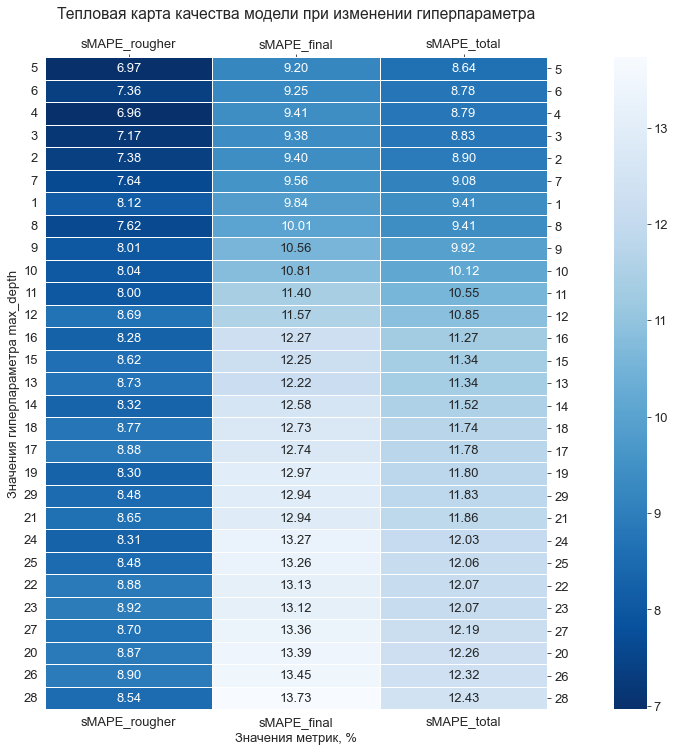

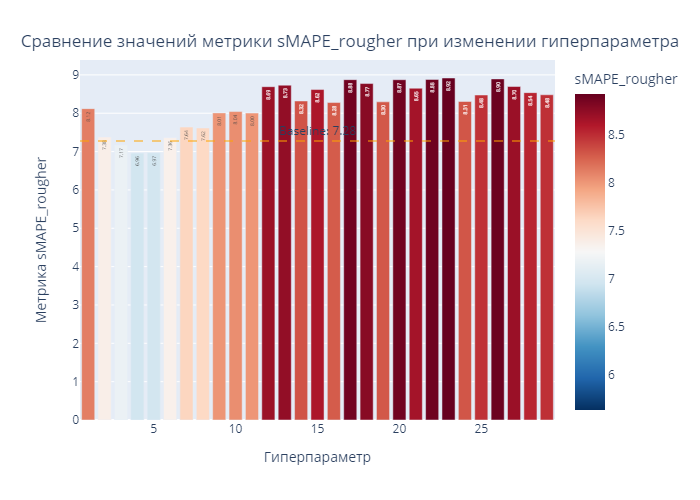

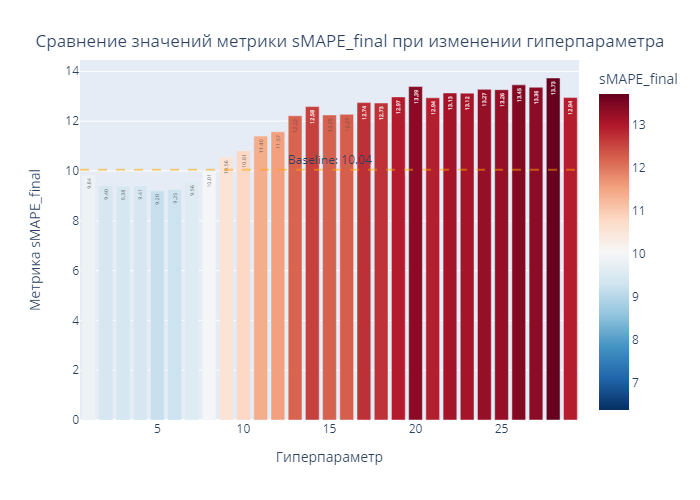

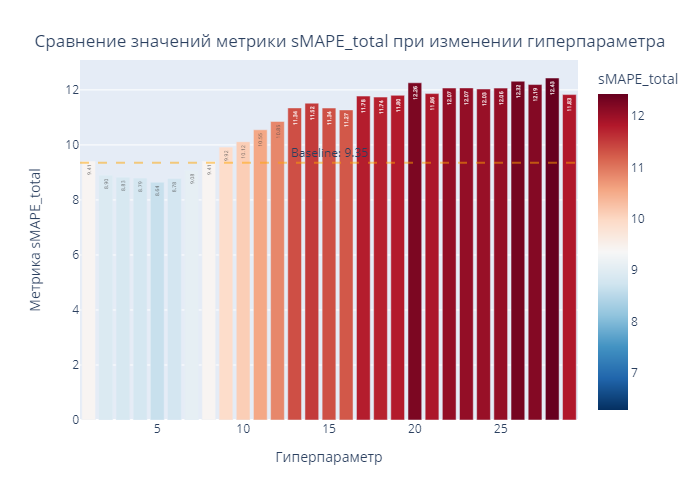

CPU times: total: 4min 7s
Wall time: 4min 13s


In [62]:
%%time
parameter_range = range(1, 30)
parameters_other = {}

model_tree, df_tree, sMAPE_total_tree  = sMAPE_metrics(DecisionTreeRegressor,
                                                       'max_depth',
                                                       parameter_range,
                                                       parameters_other) 

##### Случайный лес

Лучшая модель: RandomForestRegressor(max_depth=4, n_estimators=4, random_state=42)
Лучшее значение изменяемого гиперпараметра n_estimators=4
Лучшее значение метрики "sMAPE_total": 8.39<9.35
Качество лучше базового уровня


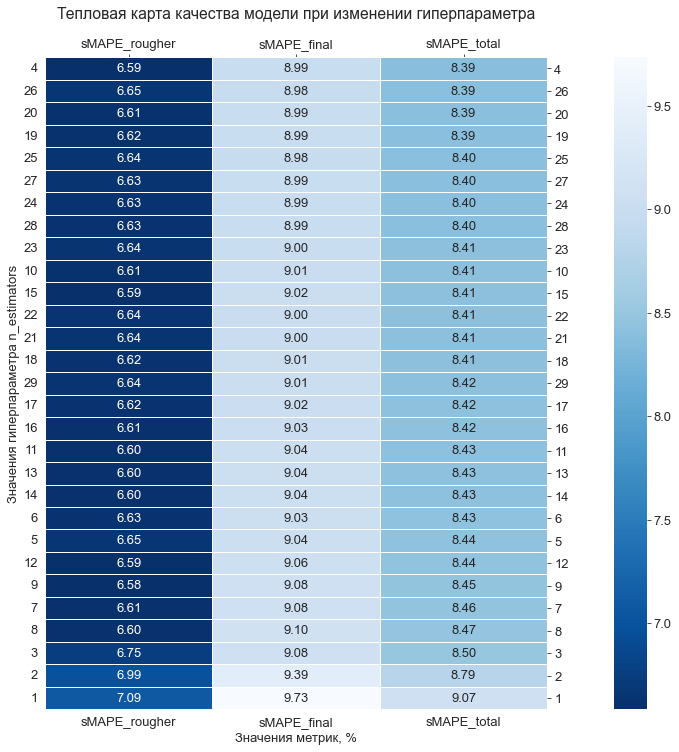

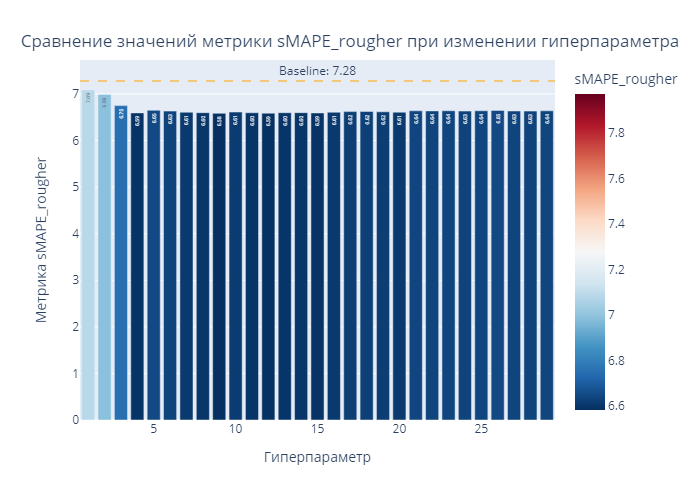

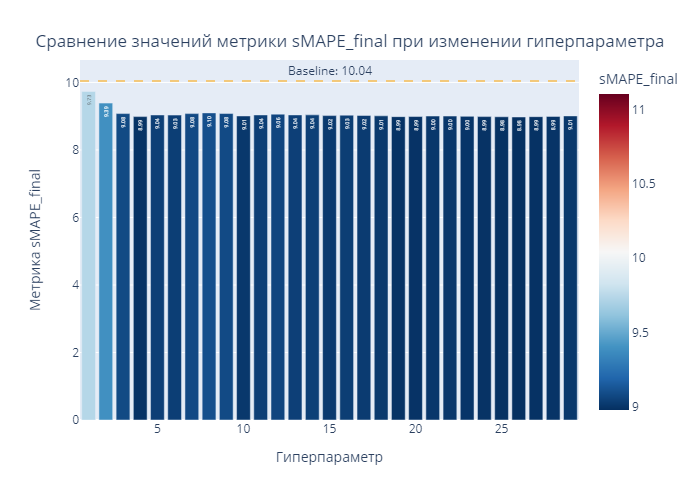

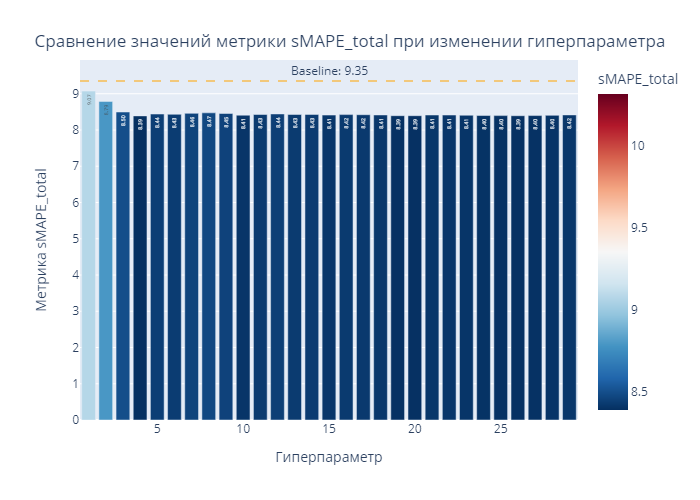

CPU times: total: 13min 55s
Wall time: 14min 6s


In [63]:
%%time
parameter_range = range(1, 30)
parameters_other = {'max_depth':4}

model_forest, df_forest, sMAPE_total_forest  = sMAPE_metrics(RandomForestRegressor,
                                                             'n_estimators',
                                                             parameter_range,
                                                             parameters_other)

##### Гребневая регрессия

Лучшая модель: Ridge(alpha=14000, random_state=42, solver='cholesky')
Лучшее значение изменяемого гиперпараметра alpha=14000
Лучшее значение метрики "sMAPE_total": 8.34<9.35
Качество лучше базового уровня


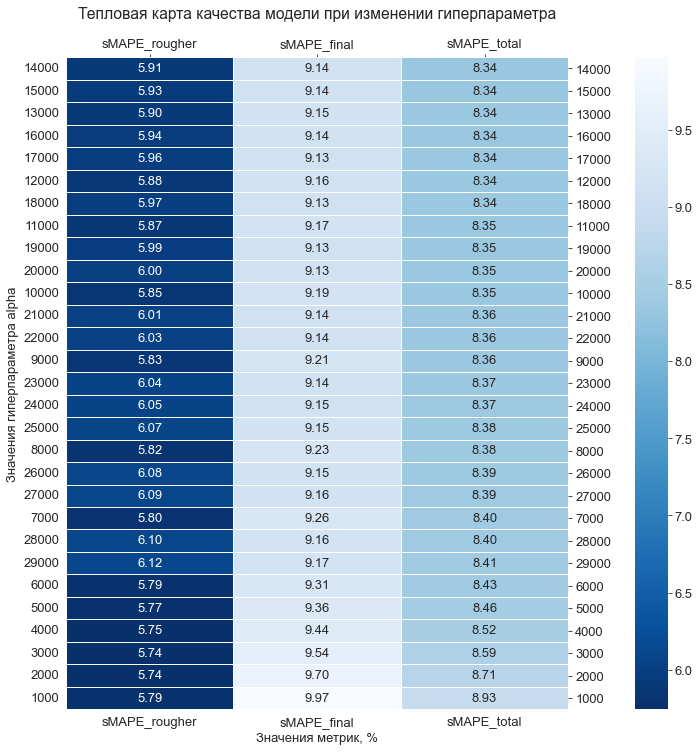

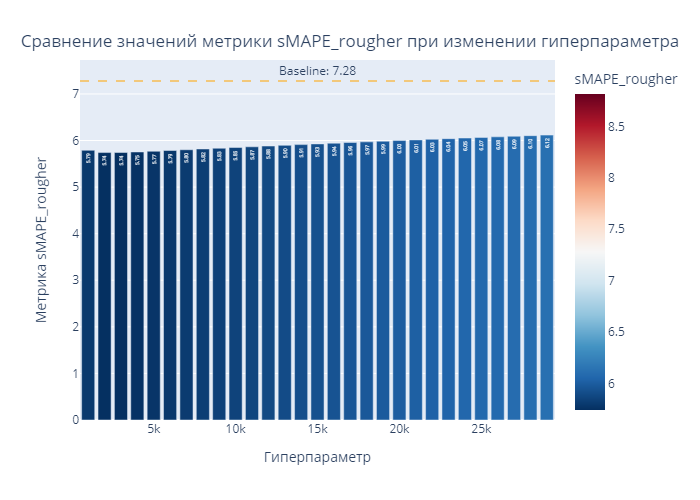

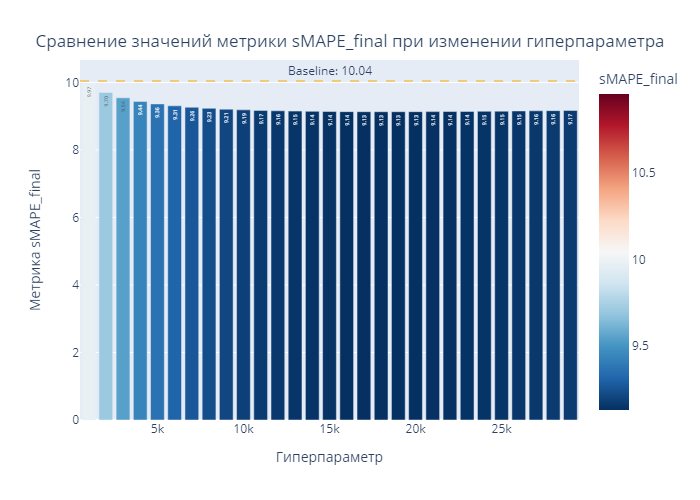

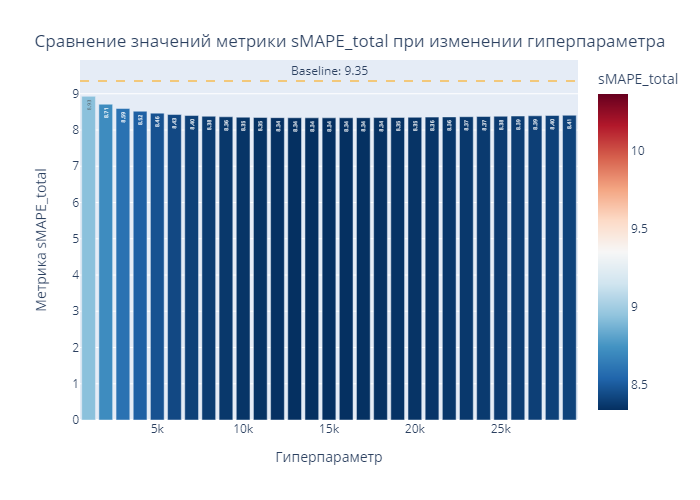

CPU times: total: 7.41 s
Wall time: 7.7 s


In [64]:
%%time
parameter_range = range(1000, 30000, 1000)
parameters_other = {'solver' : 'cholesky'}

model_ridge, df_ridge, sMAPE_total_ridge  = sMAPE_metrics(Ridge,
                                                          'alpha',
                                                          parameter_range,
                                                          parameters_other) 

#### Модели с неизменяемыми параметрами

<ins>Создадим функцию `sMAPE_metrics_unchange()`.<ins/>

На входе функции:
- `model` - модель с необходимыми фиксированными параметрами

На выходе функции:
- `model` - модель
- `sMAPE_total` - значение метрики `sMAPE_total`

In [65]:
def sMAPE_metrics_unchange(model):
    
    '''Метрика sMAPE для целевого признака "rougher" '''
    
    sMAPE_rougher = cross_val_score(model,
                                    features_train,
                                    target_rougher_train,
                                    scoring=make_scorer(sMAPE),
                                    cv=3).mean()   
    
    '''Метрика sMAPE для целевого признака "final" '''
    
    sMAPE_final = cross_val_score(model,
                                  features_train,
                                  target_final_train,
                                  scoring=make_scorer(sMAPE),
                                  cv=3).mean()
    
    '''Метрика sMAPE_total для целевых признаков "rougher" и "final" '''
    
    sMAPE_total = .25*sMAPE_rougher + .75*sMAPE_final
    
    print(f'\033[1m\033[4mМодель: {model}\033[0m')
    print(f'Значение метрики "sMAPE_total": {sMAPE_total:.2f}')
    
    return model, sMAPE_total

##### Лассо

In [66]:
model_lasso, sMAPE_total_lasso = sMAPE_metrics_unchange(Lasso(random_state=42, alpha=1))

Модель: Lasso(alpha=1, random_state=42)
Значение метрики "sMAPE_total": 9.34


##### Линейная регрессия

In [67]:
model_linear, sMAPE_total_linear = sMAPE_metrics_unchange(LinearRegression())

Модель: LinearRegression()
Значение метрики "sMAPE_total": 12.52


##### Константная модель

In [68]:
model_dummy, sMAPE_total_dummy = sMAPE_metrics_unchange(DummyRegressor(strategy='median'))

Модель: DummyRegressor(strategy='median')
Значение метрики "sMAPE_total": 10.22


### Выбор лучшей модели

#### Датафрейм с метриками моделей

Сохраним в переменной `results` датафрейм для выбора модели лучшего качества.

Столбцы датафрейма:
- `model` - наименование модели
- `model_parameters` - наименование переменной, в которой хранится модель
- `sMAPE_total` - качество модели

In [69]:
results = pd.DataFrame({'model'           : ['DecisionTreeRegressor',
                                             'RandomForestRegressor',
                                             'Ridge',
                                             'Lasso',
                                             'LinearRegression',
                                             'DummyRegressor',
                                             'Baseline'],
                        
                        'model_parameters': ['model_tree',
                                             'model_forest',
                                             'model_ridge',
                                             'model_lasso',
                                             'model_linear',
                                             'model_dummy',
                                             'baseline'],
                        
                        'sMAPE_total'      : [sMAPE_total_tree,
                                              sMAPE_total_forest,
                                              sMAPE_total_ridge,
                                              sMAPE_total_lasso,
                                              sMAPE_total_linear,
                                              sMAPE_total_dummy,
                                              baseline_sMAPE_train['sMAPE_total'].min()]})

#### Сравнение результатов

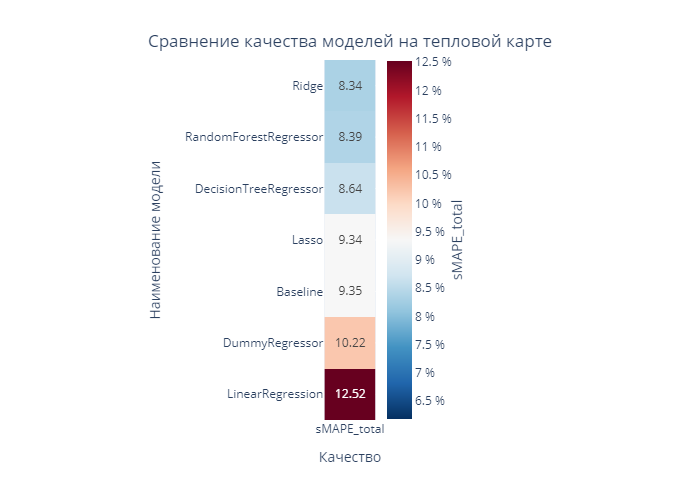

In [70]:
fig = px.imshow(results.set_index('model').sort_values(by='sMAPE_total')[['sMAPE_total']],
                color_continuous_midpoint = baseline_sMAPE_train['sMAPE_total'].min(),
                color_continuous_scale=px.colors.diverging.RdBu_r,
                text_auto='.2f')

fig.update_layout(title={'text': 'Сравнение качества моделей на тепловой карте',
                         'y':0.93,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  
                  xaxis_title='Качество',
                  yaxis_title='Наименование модели',
                  
                  coloraxis_colorbar=dict(x=.55,                                        
                                          ticksuffix=" %",
                                          len=1.05,
                                          thickness=25,
                                          title = dict(text='sMAPE_total', side='right'),
                                          dtick = 0.5)
                 )


fig.show('png')

#### Лучшая модель

In [71]:
best_model = locals()[list(results[results['sMAPE_total']==results['sMAPE_total'].min()]['model_parameters'])[0]]
print(f'\033[1m\033[4mЛучшая модель: {best_model}\033[0m')

Лучшая модель: Ridge(alpha=14000, random_state=42, solver='cholesky')


In [72]:
list(results[results['sMAPE_total']==results['sMAPE_total'].min()]['sMAPE_total'])[0]

8.335641224003194

### Тестирование лучшей модели

#### Создание функции для тестирования

Т.к. дополнительно будем проверять качество на обученной Dummy-модели, то создадим функцию `sMAPE_metrics_test()`.

На входе функции:
- `model` - модель

На выходе функции:
- `pred_rougher_test` - предсказания на тестовой выборке для target rougher
- `pred_final_test` - предсказания на тестовой выборке для target final
- `sMAPE_total_test` - метрика sMAPE для total

In [73]:
def sMAPE_metrics_test (model):
    
    model.fit(features_train, target_rougher_train) # обучение модели с target rougher
    pred_rougher_test = model.predict(features_test) # предсказания на тестовой выборке
    
    sMAPE_rougher = sMAPE(target_rougher_test, pred_rougher_test) # sMAPE для rougher
    
    model.fit(features_train, target_final_train) # обучение модели с target final
    pred_final_test = model.predict(features_test) # предсказания на тестовой выборке
    
    sMAPE_final = sMAPE(target_final_test, pred_final_test) # sMAPE для final
    
    sMAPE_total_test = sMAPE_total(target_rougher_test,
                                   pred_rougher_test,
                                   target_final_test,
                                   pred_final_test) # sMAPE для total
    
    print(f'Значение метрики "sMAPE_total": {sMAPE_total_test:.2f}')
    
    return pd.Series(pred_rougher_test), pd.Series(pred_final_test), sMAPE_total_test

#### Проверка лучшей модели на тестовой выборке.

In [74]:
pred_rougher_test, pred_final_test, sMAPE_total_test = sMAPE_metrics_test (best_model)

Значение метрики "sMAPE_total": 6.63


#### Вычисление метрики sMAPE_total для Dummy-модели

In [75]:
pred_rougher_dummy, pred_final_dummy, sMAPE_total_dummy = sMAPE_metrics_test (DummyRegressor(strategy='median'))

Значение метрики "sMAPE_total": 7.31


#### Сравнение результатов

In [76]:
results_test = pd.DataFrame({'phase'    : ['cross_val',
                                           'test',
                                           'dummy',
                                           'baseline'],
                        
                           'sMAPE_total':[list(results[results['sMAPE_total']==results['sMAPE_total'].min()]['sMAPE_total'])[0],
                                          sMAPE_total_test,
                                          sMAPE_total_dummy,
                                          baseline_sMAPE_test['sMAPE_total'].min()]})

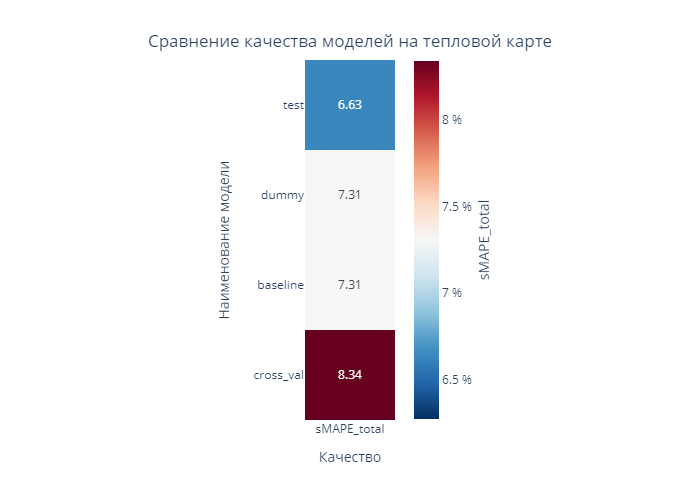

In [77]:
fig = px.imshow(results_test.set_index('phase').sort_values(by='sMAPE_total')[['sMAPE_total']],
                color_continuous_midpoint = baseline_sMAPE_test['sMAPE_total'].min(),
                color_continuous_scale=px.colors.diverging.RdBu_r,
                text_auto='.2f')

fig.update_layout(title={'text': 'Сравнение качества моделей на тепловой карте',
                         'y':0.93,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  
                  xaxis_title='Качество',
                  yaxis_title='Наименование модели',
                  
                  coloraxis_colorbar=dict(x=.6,                                        
                                          ticksuffix=" %",
                                          len=1.05,
                                          thickness=25,
                                          title = dict(text='sMAPE_total', side='right'),
                                          dtick = 0.5)
                 )


fig.show('png')

- На тестовой выборке качество получилось наилучшим.
- Модель прошла тестирование.

### Визуализация результатов машинного обучения

#### Сравнение распределений данных между целевыми признаками и предсказаниями

In [78]:
def compare_results_kde (target_rougher, target_final, pred_rougher, pred_final):    
    for target, prediction in zip([target_rougher, target_final],
                                  [pred_rougher, pred_final]):
        plt.figure(figsize=(20,10))
        
        sns.kdeplot(target, shade=True)
        sns.kdeplot(prediction, shade=True)
        
        plt.title(f'Сравнение распределений данных между целевым признаком {target.name} и его предсказаниями', fontsize=14, y=1.01)
        plt.ylabel('Оценка плотности ядра')
        plt.legend(['target', 'prediction'], title_fontsize = 14)
        plt.show()

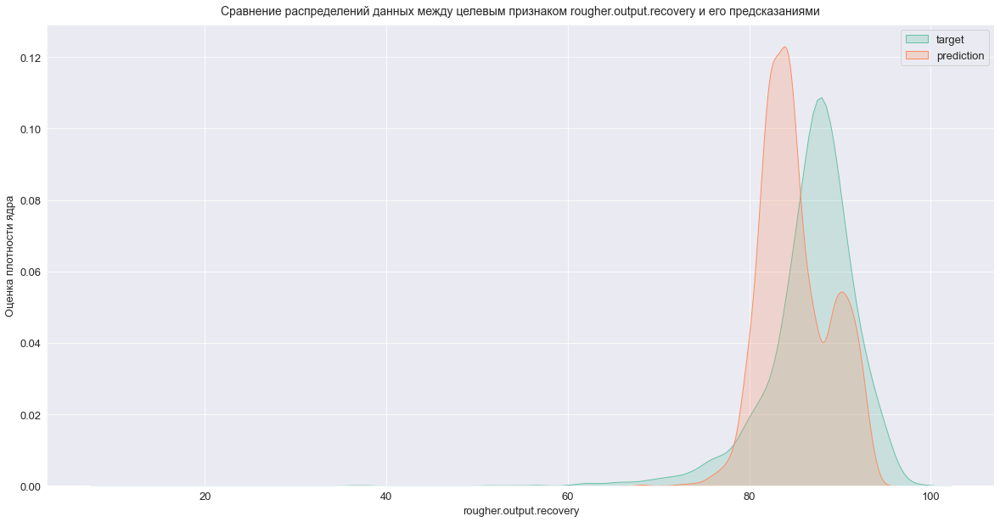

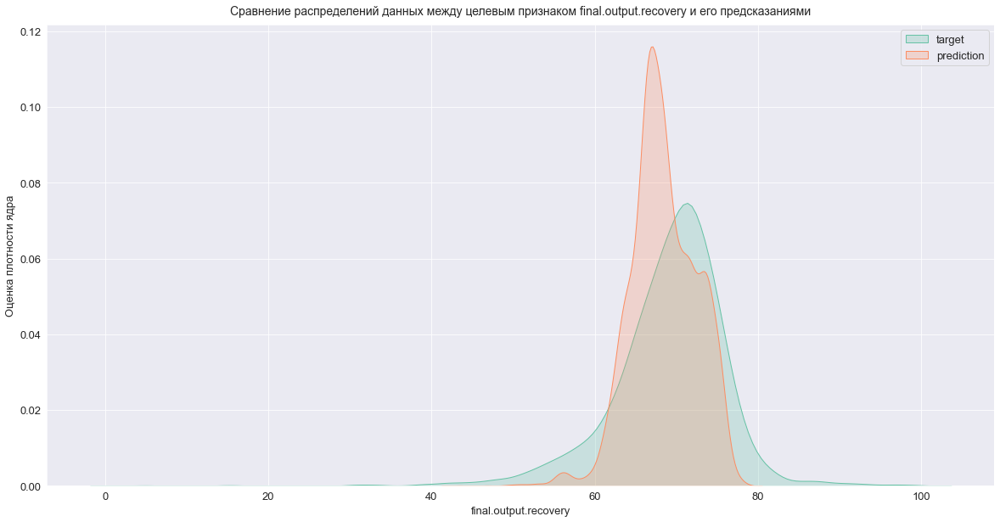

In [79]:
compare_results_kde (target_rougher_test,
                     target_final_test,
                     pred_rougher_test,
                     pred_final_test)

- Смещение данных относительно нормального распределения отрицательно влияет на качество модели, в чём и убедились графически.
- Предсказания имеют более высокий пик и более узкую форму.

Посмотрим, какие значения в целевых признаках предсказываются хуже, чем baseline. 

Создадим функцию `sAPE_total_i()` («симметричное абсолютное процентное отклонение»).

На входе функции:
- `y_r` - значение целевого признака `rougher`
- `ŷ_r` - значение предсказания `rougher`
- `y_f` - значение целевого признака `final`
- `ŷ_r` - значение предсказания `final`

На выходе функции:
- метрика `sAPE_total`, рассчитанная по формуле:

${sAPE\_total}\small=25\% \cdot sAPE(rougher)+75\% \cdot sAPE(final)$

---

где $sAPE(rougher)$ и $sAPE(final)$:

$sAPE= \Large\frac{|y_i-ŷ_i|}{(|y_i|+|ŷ_i|)/2}\small\cdot100\%$     


${\large y_i}$ - значение целевого признака для объекта с порядковым номером i в выборке, на которой измеряется качество

${\large ŷ_i}$ - значение предсказания для объекта с порядковым номером i, например, в тестовой выборке

In [80]:
def sAPE_total_i(y_r:'target_rougher', ŷ_r:'prediction_rougher', y_f:'target_final', ŷ_f:'prediction_final'):
    
    sMAPE_r = 100 * ( 2 * abs(y_r - ŷ_r)/(abs(y_r) + abs(ŷ_r)) )
    
    sMAPE_f = 100 * ( 2 * abs(y_f - ŷ_f)/(abs(y_f) + abs(ŷ_f)) )
    
    return .25*sMAPE_r + .75*sMAPE_f

Скопируем тестовые `target` и `prediction` в отдельные переменные, в которых в дальнейшем сохраним результаты хуже `baseline` (в дальнейшем `плохие` результаты).

In [81]:
target_rougher_test_bad = target_rougher_test.copy()
pred_rougher_test_bad = pred_rougher_test.copy()
target_final_test_bad = target_final_test.copy()
pred_final_test_bad = pred_final_test.copy()

При помощи `list comprehension` создадим список всех `sAPE_total` для тестовой выборки

In [82]:
sAPE_total = [sAPE_total_i(target_rougher_test[i],
                           pred_rougher_test[i],
                           target_final_test[i],
                           pred_final_test[i]) for i in range(len(target_rougher_test))]

- поместим `target` и `prediction` в датафреймы
- добавим столбец с метрикой `sAPE_total` 
- приведём к одному формату по индексам и наименованиям столбцов
- отфильтруем по значениям качества хуже `baseline`

In [83]:
for t, recovery_col in zip(['target_rougher_test_bad', 'pred_rougher_test_bad', 'target_final_test_bad', 'pred_final_test_bad'],
                   ['rougher.output.recovery', 'rougher.output.recovery', 'final.output.recovery', 'final.output.recovery']):           
    locals()[t] = pd.DataFrame(locals()[t])
    locals()[t]['sAPE_total'] = sAPE_total
    locals()[t].index = target_rougher_test.index
    locals()[t].columns = [recovery_col, 'sAPE_total']
    locals()[t] = locals()[t][locals()[t]['sAPE_total']>baseline_sMAPE_test['sMAPE_total'].min()]

Сравнение распределений данных между целевыми признаками и предсказаниями для `плохих` предсказаний.

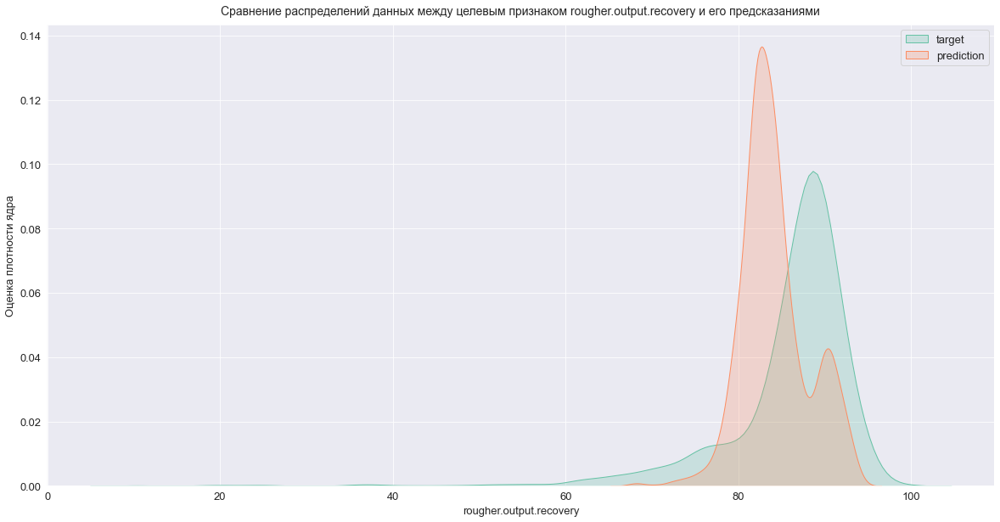

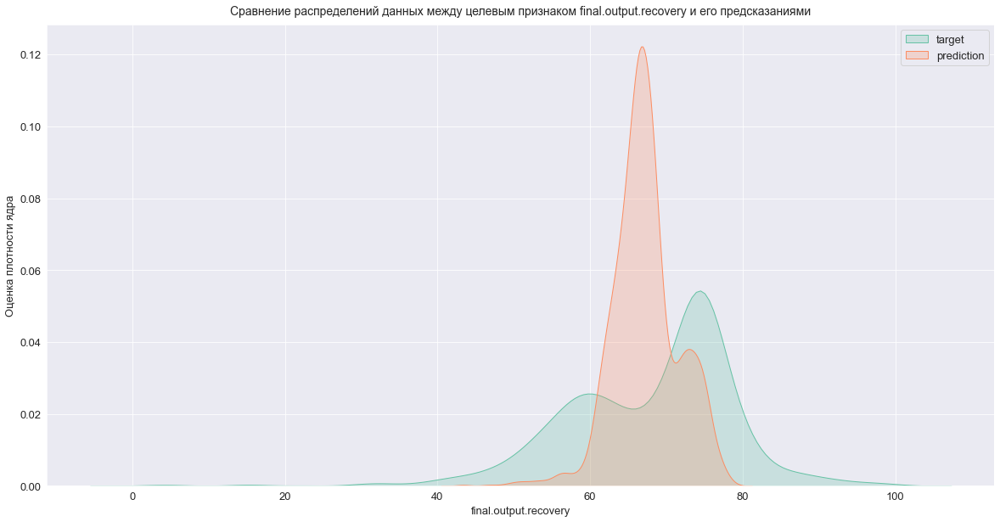

In [84]:
compare_results_kde (target_rougher_test_bad['rougher.output.recovery'],
                     target_final_test_bad['final.output.recovery'],
                     pred_rougher_test_bad['rougher.output.recovery'],
                     pred_final_test_bad['final.output.recovery'])

Для целевого признка `rougher.output.recovery` распределения аналогичны наблюдениям выше и не дают представления о том какие именно значения эффективностей плохо предсказываются.

Для целевого признка `final.output.recovery` виден провал в районе 60-70%. В этом диапазоне модель предсказывает лучше.

#### Зависимость целевых признаков от предсказаний.

Чем ближе зависимость к линии с углом 45°, тем лучше качество.

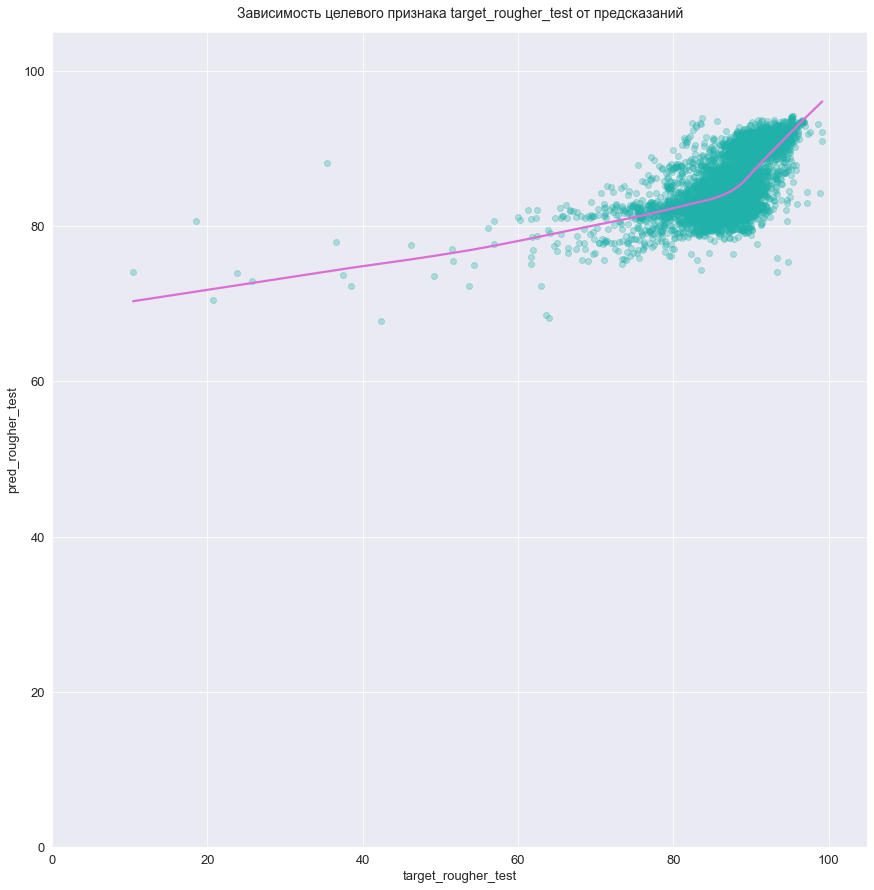

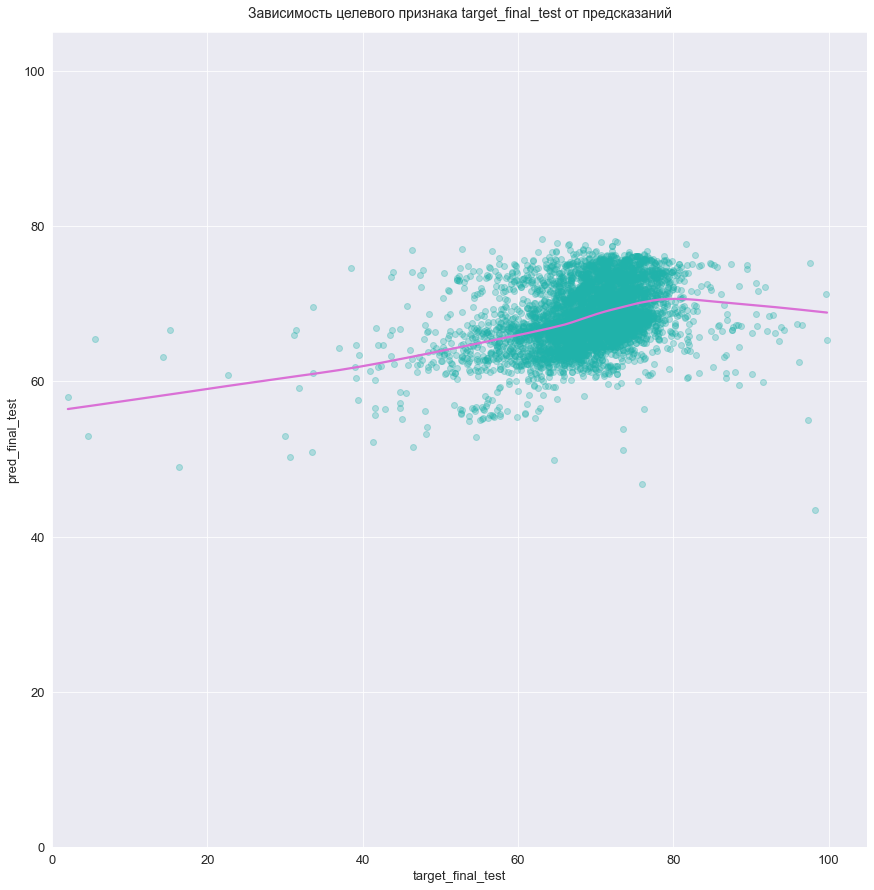

In [85]:
for tar, pred in zip(['target_rougher_test', 'target_final_test'],
                     ['pred_rougher_test', 'pred_final_test']):
    
    plt.figure(figsize=(15,15))
    
    sns.regplot(x=locals()[tar],
                y=locals()[pred],
                lowess=True,
                scatter_kws={'color': 'lightseagreen', 'alpha':.3},
                line_kws={"color": 'orchid'})

    plt.title(f'Зависимость целевого признака {tar} от предсказаний', fontsize=14, y=1.01)
    plt.xlabel(f'{tar}')
    plt.ylabel(f'{pred}')
    plt.xlim(0, 105)
    plt.ylim(0, 105)
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.show()

- На всём диапазоне данных зависимость далека от линии с углом 45°.
- Хорошо предсказываются (зависимоть близка к линии с углом 45°) эффективности от 85 до 95 для целевого признака `rougher.output.recovery` и от 65 до 75 для целевого признака `final.output.recovery`.

#### Зависимость значений в целевых признаках и предсказаниях от ошибки, превышающей baseline.

In [86]:
data_fig = []

In [87]:
for samp, y_recovery, col in zip(
                    ['target_rougher_test_bad', 'pred_rougher_test_bad', 'target_final_test_bad', 'pred_final_test_bad'],
                    ['rougher.output.recovery', 'rougher.output.recovery', 'final.output.recovery', 'final.output.recovery'],
                    ['lightseagreen', 'orchid', 'orange', 'royalblue']):

    locals()[f'{samp}_fig'] = go.Scatter(x=locals()[samp]['sAPE_total'],
                                              y=locals()[samp][y_recovery],
                                              mode='markers',
                                              opacity=0.8,
                                              name=samp,
                                              marker=dict(color=col, opacity=0.3))
    data_fig.append(locals()[f'{samp}_fig'])

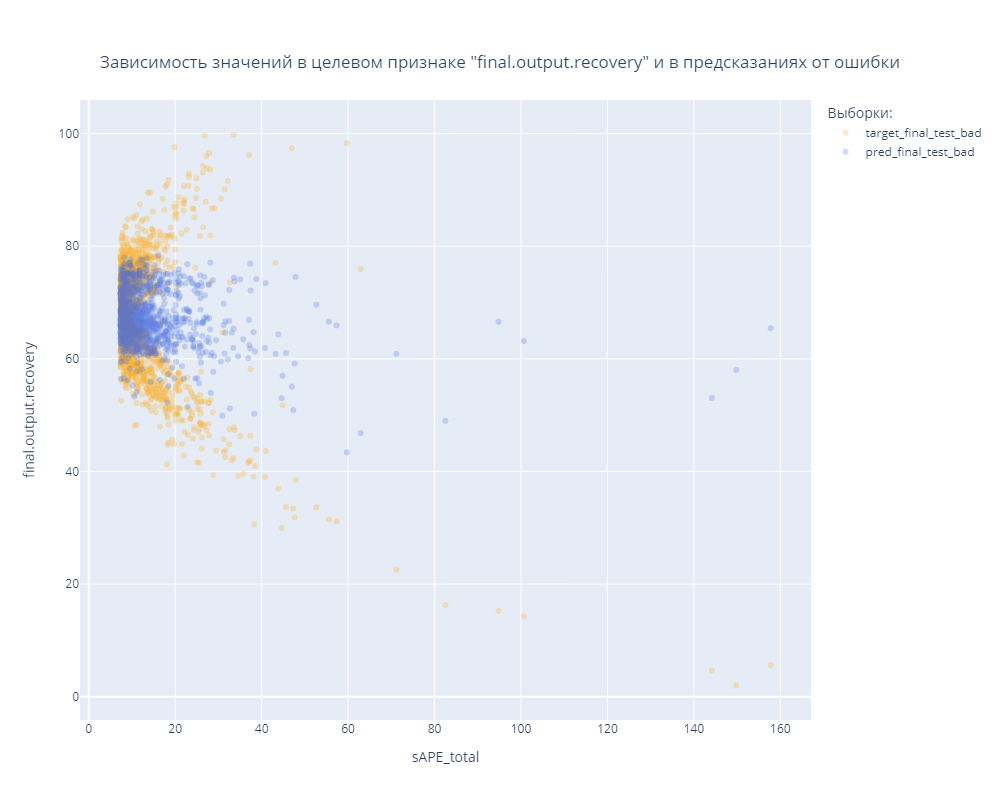

In [88]:
fig = go.Figure(data=data_fig[:2], layout=layout)

fig.update_layout(title={'text': 'Зависимость значений в целевом признаке "rougher.output.recovery" и в предсказаниях от ошибки',
                         'y':0.93,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
              
                  xaxis_title='sAPE_total',
                  yaxis_title='rougher.output.recovery',
                  legend_title='Выборки:')
fig.show()

fig = go.Figure(data=data_fig[2:], layout=layout)

fig.update_layout(title={'text': 'Зависимость значений в целевом признаке "final.output.recovery" и в предсказаниях от ошибки',
                         'y':0.93,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
              
                  xaxis_title='sAPE_total',
                  yaxis_title='final.output.recovery',
                  legend_title='Выборки:')
fig.show('png')

- Данным, выходящим за пределы нормального распределения модель предсказывает значения в пределах нормального распределения.
- Ещё раз убедились что скошенный набор данных отрицательно влияет на предсказания модели и её качество.

#### Визуализация разницы между целевыми признаками и предсказаниями

Сохраним из имеющихся датафреймов с `плохим` качеством `target` и `prediction` в отдельные переменные, тип данных переменных - `pd.Series`.

In [89]:
target_rougher_bad = target_rougher_test_bad['rougher.output.recovery']
pred_rougher_bad = pred_rougher_test_bad['rougher.output.recovery']
target_final_bad = target_final_test_bad['final.output.recovery']
pred_final_bad = pred_final_test_bad['final.output.recovery']

Для визуализации разницы между целевыми признаками и предсказаниями построим точечные диаграммы

In [90]:
data_test = []

In [91]:
for tar, col in zip(['target_rougher_bad', 'pred_rougher_bad', 'target_final_bad', 'pred_final_bad'],
                    ['lightseagreen', 'orange', 'orchid', 'royalblue']):
    
    locals()[f'{tar}_fig'] = go.Scatter(x=locals()[tar].index,
                                        y=locals()[tar],
                                        mode='markers',
                                        opacity=0.8,
                                        name=tar,
                                        marker=dict(color=col, opacity=0.3))
    data_test.append(locals()[f'{tar}_fig'])

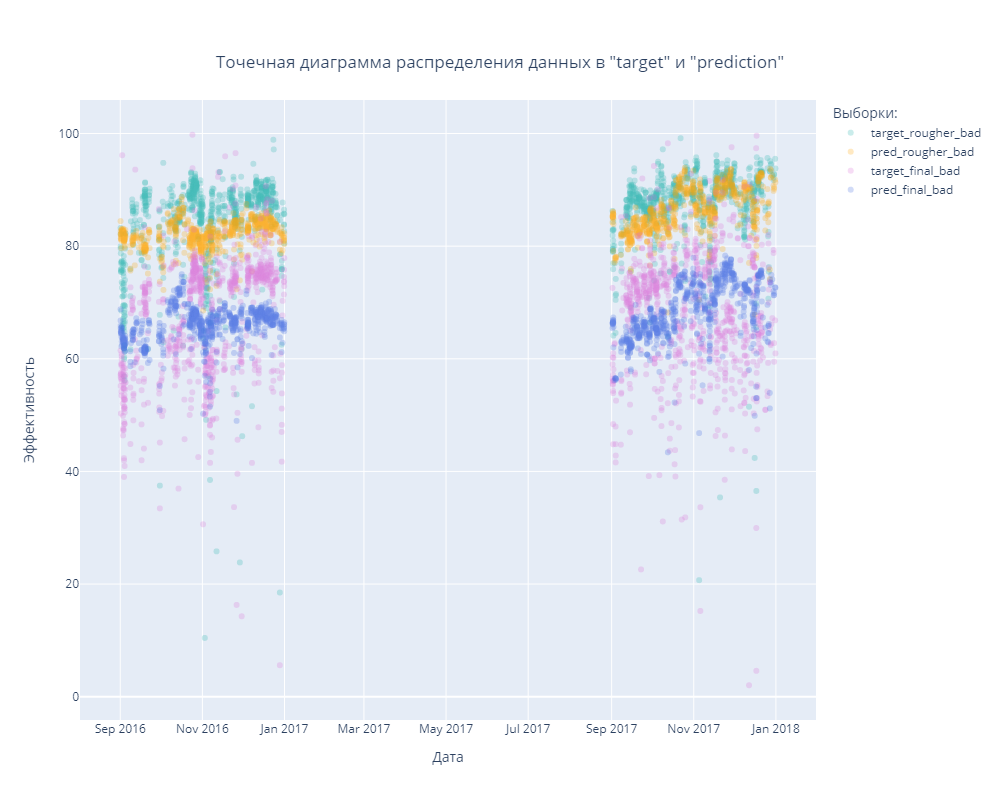

In [92]:
fig = go.Figure(data=data_test, layout=layout)

fig.update_layout(title={'text': 'Точечная диаграмма распределения данных в "target" и "prediction"',
                         'y':0.93,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  
                  xaxis_title='Дата',
                  yaxis_title='Эффективность',
                  legend_title='Выборки:')

fig.show('png')

Т.к. данные разбиты на временные диапазоны, смасштабируем график в каждом временном диапазоне.
- точками покажем `target`
- линиями покажем `prediction`

In [93]:
data_test_markers = []

In [94]:
for tar, col, mode in zip(['target_rougher_bad', 'pred_rougher_bad', 'target_final_bad', 'pred_final_bad'],
                          ['lightseagreen', 'orange', 'orchid', 'royalblue'],
                          ['markers', 'lines', 'markers', 'lines']):
    
    locals()[f'{tar}_fig'] = go.Scatter(x=locals()[tar].index,
                                        y=locals()[tar],
                                        mode=mode,
                                        opacity=0.8,
                                        name=tar,
                                        marker=dict(color=col, opacity=0.3))
    data_test_markers.append(locals()[f'{tar}_fig'])

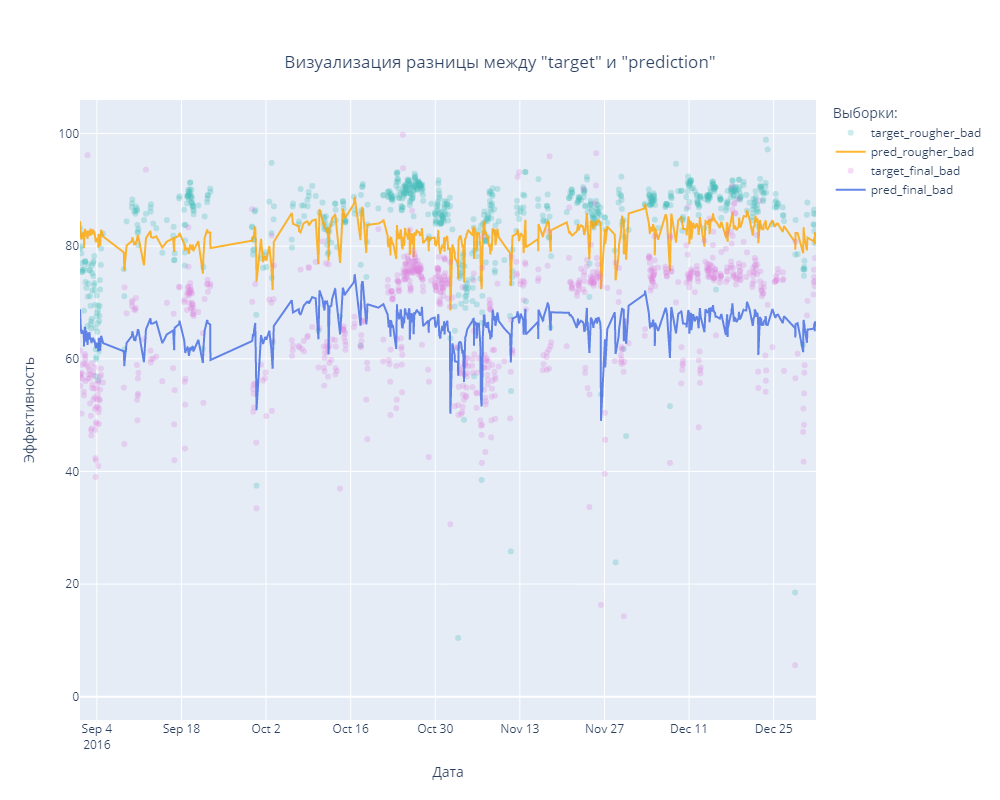

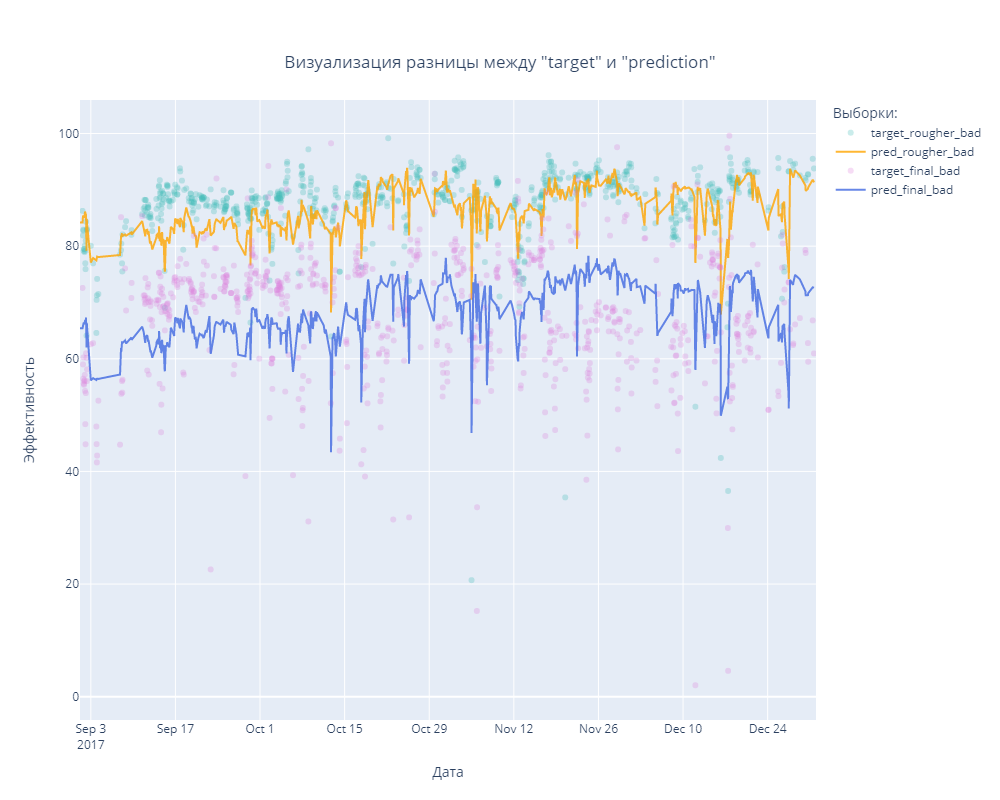

In [95]:
fig = go.Figure(data=data_test_markers, layout=layout)

fig.update_layout(title={'text': 'Визуализация разницы между "target" и "prediction"',
                         'y':0.93,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  
                  xaxis_title='Дата',
                  yaxis_title='Эффективность',
                  legend_title='Выборки:')

fig.update_xaxes(range=['2016-09-01 04:59:59', '2016-12-31 23:59:59'])

fig.show('png')

fig.update_xaxes(range=['2017-09-01 04:59:59', '2017-12-31 23:59:59'])

fig.show('png')

- По графикам видно что редкие и выбивающиеся значения предсказываются хуже.
- Заказчику будет представлена модель неплохо работающая с предсказаниями значений в пределах нормального распеделения данных.

## Выводы

Для компании «Цифра»:
- проведено EDA исследование данных,
- данные обработаны для машинного обучения,
- подготовлен прототип модели машинного обучения.

Лучшая модель:

In [96]:
best_model

Ridge(alpha=14000, random_state=42, solver='cholesky')

Модель предсказывает коэффициент восстановления золота из золотосодержащей руды и поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.